# Top Spotify Songs 2010-2019 Data Analysis 

Student: Isabella Lindgren <br/>
Course: Part-time Data Science Student <br/>
Instructor: Eli <br/>
Submission Date: April 28, 2020 <br/>
Blog Post URL: https://towardsdatascience.com/a-beginners-guide-to-deep-learning-ed41ac75c4e5

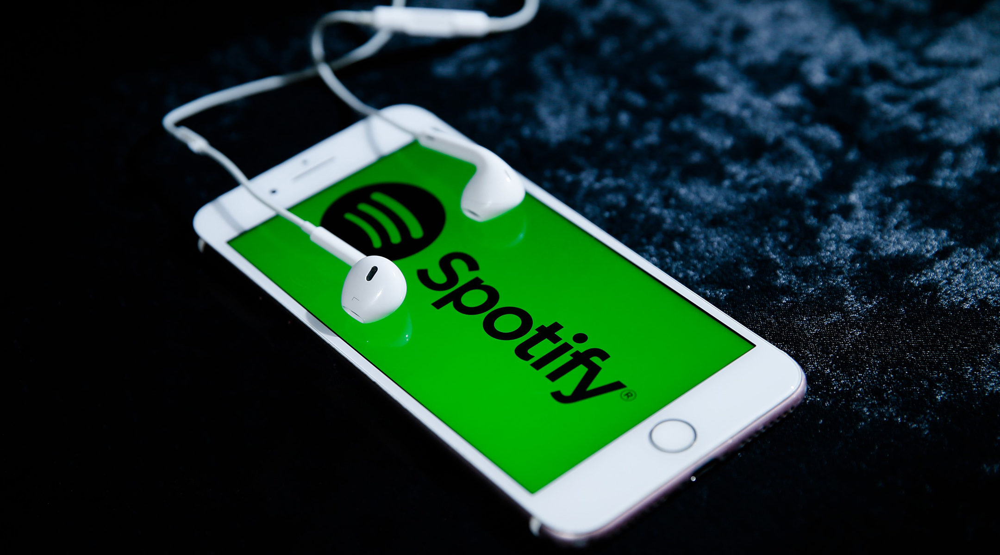

## Introduction/Business Understanding

Spotify is a digital audio streaming platform that originated in Stockholm, Sweden. It has rapidly grown in popularity worldwide since it was founded in 2006. Spotify provides access to music, podcasts and video content from record labels and media companies to consumers around the world! Users are able to browse a wide variety of tracks by artist, album, or genre and can create, edit and share playlists.
<br/>
<br/>
Spotify's mission as a company is to provide a unique and exceptional listening experience to its customers. As a Spotify data scientist, we want to better understand what attributes make tracks popular to the masses so we can optimize our platform to provide interesting content. We also want to gain a better understanding of the music choices and streaming habits/preferences of our users in order to personalize.
<br/>
<br/>
Our main objective is to gain Spotify Premium users and to retain them long term. We also want to provide insight into what kind of content to invest in. 

## About our Data:

For this initial analyses, we will be using a data set which was sourced from kaggle that contains the top spotify songs from 2010-2019.
<br/> <br/>
https://www.kaggle.com/leonardopena/top-spotify-songs-from-20102019-by-year

Our data utilizes the following attributes:

> - ID
- Song Title
- Artist
- Genre of the Track
- Year Song was on Billboard
- BPM: Beats Per Minute (Tempo of the song)
- Energy of the song. The higher the value, the more energetic the song. 
- Danceability - The higher the value, the easier it is to dance to this song.
- dB - Loudness - The higher the value, the louder the song
- Live - The higher the value, the more likely the song is a live recording
- Valence - The higher the value, the more positive mood for the song.
- durLength - The duration of the song.
- Acousticness - The higher the value the more acoustic the song is.
- Speechiness - The higher the value the more spoken word the song contains.
- Popularity- The higher the value the more popular the song is.

You can read more in depth descriptions of the data attributes here: https://developer.spotify.com/documentation/web-api/reference/tracks/get-audio-features/

## Loading our data

First, let's load helpful libraries that we will be using for our exploratory data analysis and subsequent analyses.

In [2]:
# Standard Necessary Libraries
import numpy as np 
import pandas as pd 
from scipy import stats
import matplotlib.pyplot as plt

#For EDA
import pandas_profiling
from pandas_profiling import ProfileReport
import seaborn as sns
import missingno as msno
from wordcloud import WordCloud
import sklearn
import warnings
warnings.filterwarnings("ignore")
import plotly.express as px

#For K-Means Clustering
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.neighbors import KNeighborsClassifier

# For Hypothesis Testing
import scipy.stats as scs
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multicomp import MultiComparison

#For Machine Learning
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn import metrics

%matplotlib inline

In [3]:
# Read in our data .csv file downloaded from kaggle.
data = pd.read_csv("top-spotify-songs-from-20102019-by-year/top10s.csv", encoding='ISO-8859-1')
data.head()

,Unnamed: 0,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,1,"Hey, Soul Sister",Train,neo mellow,2010,97,89,67,-4,8,80,217,19,4,83
1,2,Love The Way You Lie,Eminem,detroit hip hop,2010,87,93,75,-5,52,64,263,24,23,82
2,3,TiK ToK,Kesha,dance pop,2010,120,84,76,-3,29,71,200,10,14,80
3,4,Bad Romance,Lady Gaga,dance pop,2010,119,92,70,-4,8,71,295,0,4,79
4,5,Just the Way You Are,Bruno Mars,pop,2010,109,84,64,-5,9,43,221,2,4,78


In [4]:
# drop the unnamed column since it is not useful as index
data.drop("Unnamed: 0", axis=1, inplace=True)
data.head()

,title,artist,top genre,year,bpm,nrgy,dnce,dB,live,val,dur,acous,spch,pop
0,"Hey, Soul Sister",Train,neo mellow,2010,97,89,67,-4,8,80,217,19,4,83
1,Love The Way You Lie,Eminem,detroit hip hop,2010,87,93,75,-5,52,64,263,24,23,82
2,TiK ToK,Kesha,dance pop,2010,120,84,76,-3,29,71,200,10,14,80
3,Bad Romance,Lady Gaga,dance pop,2010,119,92,70,-4,8,71,295,0,4,79
4,Just the Way You Are,Bruno Mars,pop,2010,109,84,64,-5,9,43,221,2,4,78


## Data Cleaning

In [5]:
# Get an overview of our data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 603 entries, 0 to 602
Data columns (total 14 columns):
title        603 non-null object
artist       603 non-null object
top genre    603 non-null object
year         603 non-null int64
bpm          603 non-null int64
nrgy         603 non-null int64
dnce         603 non-null int64
dB           603 non-null int64
live         603 non-null int64
val          603 non-null int64
dur          603 non-null int64
acous        603 non-null int64
spch         603 non-null int64
pop          603 non-null int64
dtypes: int64(11), object(3)
memory usage: 66.0+ KB


We can see that title, artist, and genre are categorical variables and the rest are numerical. All variables have the same amount of entries so there are no missing values.  

In [6]:
# Renaming columns so they are easier to read

data.rename(columns = {'title': 'track','top genre': 'top_genre', 'bpm': 'beats_per_minute', 'nrgy': 'energy', 
                       'dnce': 'danceability', 'dB': 'loudness(dB)', 'live': 'liveness', 
                       'val': 'valence', 'dur': 'length', 'acous': 'acousticness', 
                       'spch': 'speechiness', 'pop': 'popularity'}, inplace=True)
data.head()

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
0,"Hey, Soul Sister",Train,neo mellow,2010,97,89,67,-4,8,80,217,19,4,83
1,Love The Way You Lie,Eminem,detroit hip hop,2010,87,93,75,-5,52,64,263,24,23,82
2,TiK ToK,Kesha,dance pop,2010,120,84,76,-3,29,71,200,10,14,80
3,Bad Romance,Lady Gaga,dance pop,2010,119,92,70,-4,8,71,295,0,4,79
4,Just the Way You Are,Bruno Mars,pop,2010,109,84,64,-5,9,43,221,2,4,78


In [7]:
#sanity check that we aren't missing any values
data.isnull().sum()

track               0
artist              0
top_genre           0
year                0
beats_per_minute    0
energy              0
danceability        0
loudness(dB)        0
liveness            0
valence             0
length              0
acousticness        0
speechiness         0
popularity          0
dtype: int64

In [8]:
# are there any null/NaN values?
data.isnull().values.any()

False

Let's have a general overview of the stats of our data to see if the values look ok.

In [9]:
data.describe()

,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
count,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000,603.000000
mean,2014.592040,118.545605,70.504146,64.379768,-5.578773,17.774461,52.225539,224.674959,14.326700,8.358209,66.520730
std,2.607057,24.795358,16.310664,13.378718,2.798020,13.102543,22.513020,34.130059,20.766165,7.483162,14.517746
min,2010.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,134.000000,0.000000,0.000000,0.000000
25%,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,221.000000,6.000000,5.000000,69.000000
75%,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.500000,17.000000,9.000000,76.000000
max,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000


We can see that the min beats_per_minute is 0, which seems to be an error since a song wouldn't have 0 beats. Let's have a look at our mean, median, and std and see the distribution of our values to determine what we should use to substitute in for our zero values.

mean      118.545605
median    120.000000
std        24.795358
Name: beats_per_minute, dtype: float64


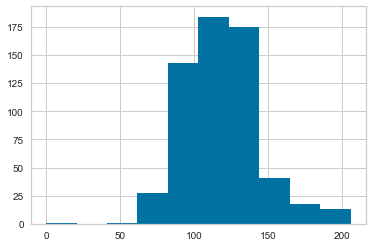

In [10]:
print(data.beats_per_minute.apply(['mean', 'median', 'std'])) 
data.beats_per_minute.hist();

We can see that zero is an outlier. We will substitute the mean for zero values to reduce bias in our data. 

In [11]:
# For the outlier, replace 0 with the mean bpm
data.beats_per_minute = data.beats_per_minute.replace(0, data.beats_per_minute.mean())

In [12]:
# check to see the new min bpm
data.beats_per_minute.describe()

count    603.000000
mean     118.742198
std       24.319275
min       43.000000
25%      100.000000
50%      120.000000
75%      129.000000
max      206.000000
Name: beats_per_minute, dtype: float64

Now let's check for duplicates by track name since that is a defining feature.

In [13]:
# count the amount of values with the same track name
print(data['track'].value_counts().head(20))

Love Yourself                                      2
Runnin' (Lose It All)                              2
Just the Way You Are                               2
Castle Walls (feat. Christina Aguilera)            2
First Time                                         2
All I Ask                                          2
The Hills                                          2
A Little Party Never Killed Nobody (All We Got)    2
Written in the Stars (feat. Eric Turner)           2
Kissing Strangers                                  2
Company                                            2
Hello                                              2
Here                                               2
Marry You                                          2
Say Something                                      2
Stitches                                           2
Sugar                                              2
I Like It                                          2
We Are Never Ever Getting Back Together       

There are duplicate track names. Let's explore these to see if they are different tracks with the same name or if they are the same track.

In [14]:
# Look at all the information for the tracks with the name 'Just the Way You Are'
data[data.track == 'Just the Way You Are']

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
4,Just the Way You Are,Bruno Mars,pop,2010,109.0,84,64,-5,9,43,221,2,4,78
54,Just the Way You Are,Bruno Mars,pop,2011,109.0,84,64,-5,9,43,221,2,4,78


We can see that some of the tracks are counted twice since they cover two different years. Let's remove the duplicate values. 

In [15]:
# define subset of data where the track name and artist is duplicated
duplicates = data[data.duplicated(subset=['track','artist'])]
print(len(duplicates))

16


In [16]:
# drop duplicates from dataset, keeping the first one
data.drop_duplicates(subset=['track','artist'], keep='first', inplace=True)

In [17]:
# Double check the tracks
data['track'].value_counts().head(20)

I Like It                                 2
Say Something                             2
Hello                                     2
Fireball (feat. John Ryan)                1
Love Yourself                             1
Here                                      1
Despacito - Remix                         1
Take It Off                               1
Heartbeat Song                            1
Naturally                                 1
I Want You To Know                        1
Slow Hands                                1
All I Ask                                 1
Water Under the Bridge                    1
Really Don't Care                         1
Love Incredible (feat. Camila Cabello)    1
Everybody Talks                           1
Drunk in Love                             1
24K Magic                                 1
Titanium (feat. Sia)                      1
Name: track, dtype: int64

In [18]:
data[data.track == 'Hello']

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
50,Hello,Martin Solveig,big room,2010,128.0,98,67,-3,10,45,191,1,3,0
295,Hello,Adele,british soul,2015,158.0,45,48,-6,9,29,295,34,3,73


We can see that the tracks names that are doubled don't have the same artist so we'll keep both. Now that we have removed the duplicates in our data, let's have a look at our distribution of genres.

In [19]:
# get the counts of tracks in each genre
data['top_genre'].value_counts()

dance pop                    324
pop                           56
canadian pop                  31
boy band                      15
barbadian pop                 15
electropop                    13
british soul                  10
big room                      10
neo mellow                     9
art pop                        8
canadian contemporary r&b      7
australian dance               6
complextro                     6
hip pop                        6
australian pop                 5
permanent wave                 4
latin                          4
edm                            4
hip hop                        4
atl hip hop                    4
colombian pop                  3
canadian hip hop               2
folk-pop                       2
indie pop                      2
brostep                        2
detroit hip hop                2
electronic trap                2
belgian edm                    2
tropical house                 2
downtempo                      2
baroque po

We can see that there are many different variations of genres based on location, etc. This may cause issues in our classification models later on. Let's keep this data and make a separate dataframe that includes more general, consolidated genre names.  

In [20]:
# Make a new variable that we will manipulate called 'data_2'
data_2 = data
data_2['top_genre'].value_counts()

dance pop                    324
pop                           56
canadian pop                  31
boy band                      15
barbadian pop                 15
electropop                    13
british soul                  10
big room                      10
neo mellow                     9
art pop                        8
canadian contemporary r&b      7
australian dance               6
complextro                     6
hip pop                        6
australian pop                 5
permanent wave                 4
latin                          4
edm                            4
hip hop                        4
atl hip hop                    4
colombian pop                  3
canadian hip hop               2
folk-pop                       2
indie pop                      2
brostep                        2
detroit hip hop                2
electronic trap                2
belgian edm                    2
tropical house                 2
downtempo                      2
baroque po

In [21]:
# for loop to consolidate similar subgenres
for i in data_2['top_genre']:
    if 'pop' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'pop')
        
    elif 'hip hop' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'hip hop')

    elif 'edm' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'edm')

    elif 'r&b' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'pop')

    elif 'latin' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'latin')

    elif 'room' in i:
        data_2['top_genre'] = data_2['top_genre'].replace(i, 'room')

    elif 'electro' in i:
        data_2['top_genre'] = data['top_genre'].replace(i, 'edm')
        
data_2['top_genre'] = data_2['top_genre'].replace('chicago rap', 'hip hop')

# Check the counts of remaining genres
data_2["top_genre"].value_counts()

pop                        483
boy band                    15
hip hop                     14
room                        12
edm                         11
british soul                10
neo mellow                   9
complextro                   6
australian dance             6
latin                        5
permanent wave               4
downtempo                    2
brostep                      2
tropical house               2
house                        1
hollywood                    1
irish singer-songwriter      1
celtic rock                  1
alaska indie                 1
contemporary country         1
Name: top_genre, dtype: int64

In [22]:
# let's rename the 'top_genre' column to 'general_genre'
data_2 = data_2.rename(columns = {'top_genre':'general_genre'})
data_2.general_genre.value_counts()

pop                        483
boy band                    15
hip hop                     14
room                        12
edm                         11
british soul                10
neo mellow                   9
complextro                   6
australian dance             6
latin                        5
permanent wave               4
downtempo                    2
brostep                      2
tropical house               2
house                        1
hollywood                    1
irish singer-songwriter      1
celtic rock                  1
alaska indie                 1
contemporary country         1
Name: general_genre, dtype: int64

There seems to be a bunch of different genres which can be grouped into a more general genre. Let's consolidate EDM, Room, Complextro, Brostep, downtempo, and house into a general genre of "Electronic." We will also consolidate some of the other subgenres into 'pop', 'indie', and 'rock'.

In [23]:
# Reclassify subgenres into more generalized genre terms
data_2['general_genre']=['electronic' if each == 'room'
                  else 'electronic' if each == 'edm'
                  else 'electronic' if each == 'complextro'
                  else 'electronic' if each == 'brostep'
                  else 'electronic' if each == 'tropical house'
                  else 'electronic' if each == 'downtempo'
                  else 'electronic' if each == 'house'
                  else 'electronic' if each == 'australian dance'
                  else 'pop' if each == 'pop'
                  else 'pop' if each == 'hollywood'
                  else 'pop' if each == 'irish singer-songwriter'
                  else 'pop' if each == 'boy band'
                  else 'pop' if each == 'contemporary country'
                  else 'indie' if each == 'alaska indie'
                  else 'indie' if each == 'neo mellow'
                  else 'indie' if each == 'british soul'
                  else 'rock' if each == 'celtic rock'
                  else 'rock' if each == 'permanent wave'
                  else 'hip hop' if each == 'hip hop'
                  else 'latin' for each in data_2['general_genre']]

In [24]:
# check the count of each genre
data_2.general_genre.value_counts()

pop           501
electronic     42
indie          20
hip hop        14
rock            5
latin           5
Name: general_genre, dtype: int64

In [25]:
# Let's rename data to gen_genre to make it easier for future analysis
gen_genre_data = data_2 

Now that we have our clean data sets, let's do a deep dive into our data to better understand what we are looking at.

# Exploratory Data Analysis

Brief overview - it is always good to check the shape of your data and get the general stats.

In [401]:
# get the shape of our dataframe
data.shape

(587, 14)

In [402]:
# general stats
data.describe()

,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
count,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000
mean,2014.589438,118.861236,70.494037,64.480409,-5.568995,17.853492,52.226576,224.597956,14.233390,8.275980,66.425894
std,2.611361,24.371622,16.271729,13.384988,2.825395,13.155762,22.512752,34.151118,20.560534,7.303664,14.623928
min,2010.000000,43.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,134.000000,0.000000,0.000000,0.000000
25%,2013.000000,100.000000,61.000000,57.000000,-6.000000,9.000000,35.000000,202.000000,2.000000,4.000000,60.000000
50%,2015.000000,120.000000,74.000000,66.000000,-5.000000,12.000000,52.000000,221.000000,6.000000,5.000000,69.000000
75%,2017.000000,129.000000,82.000000,73.000000,-4.000000,24.000000,69.000000,239.500000,17.000000,9.000000,76.000000
max,2019.000000,206.000000,98.000000,97.000000,-2.000000,74.000000,98.000000,424.000000,99.000000,48.000000,99.000000


In [403]:
# We will be using ProfileReport. Documentation: https://pandas-profiling.github.io/pandas-profiling/docs/

profile = pandas_profiling.ProfileReport(data)
profile

Number of variables,15
Number of observations,587
Total Missing (%),0.0%
Total size in memory,68.9 KiB
Average record size in memory,120.1 B
Numeric,11
Categorical,3
Boolean,0
Date,0
Text (Unique),0
Rejected,1


Observations: <br/>
- There are 11 numberical categories and 3 categorical categories
- The numerical values are highly skewed and will need to be standardized

Let's break down the songs by genre type to get an idea of what kinds of genres were popular from 2010-2019.

In [29]:
# Calculate the number of tracks in each genre
print(type(data['top_genre']))
popular_genre=data.groupby('top_genre').size()
print(popular_genre)
genre_list=data['top_genre'].values.tolist()

<class 'pandas.core.series.Series'>
top_genre
alaska indie                 1
australian dance             6
boy band                    15
british soul                10
brostep                      2
celtic rock                  1
complextro                   6
contemporary country         1
downtempo                    2
edm                         11
hip hop                     14
hollywood                    1
house                        1
irish singer-songwriter      1
latin                        5
neo mellow                   9
permanent wave               4
pop                        483
room                        12
tropical house               2
dtype: int64


In [30]:
#Calculating the number of songs by each of the artists
print(data.groupby('artist').size())
popular_artist=data.groupby('artist').size()
print(popular_artist)
artist_list=data['artist'].values.tolist()

artist
3OH!3                        1
5 Seconds of Summer          1
A Great Big World            1
Adam Lambert                 2
Adele                        9
Alan Walker                  1
Alessia Cara                 3
Alesso                       1
Alicia Keys                  6
Ansel Elgort                 1
Ariana Grande                9
Austin Mahone                2
Avicii                       3
Avril Lavigne                2
Bastille                     1
Bebe Rexha                   2
Beyoncé                      8
Birdy                        5
Britney Spears               9
Bruno Mars                  11
BØRNS                        1
CNCO                         1
Calvin Harris               10
Camila Cabello               3
Cardi B                      3
Carly Rae Jepsen             5
Cashmere Cat                 2
Charli XCX                   1
Charlie Puth                 3
Chris Brown                  3
                            ..
Selena Gomez                 8
S

In [31]:
# Number of tracks by year
print(data['year'].value_counts())

2015    94
2016    74
2013    70
2017    64
2018    62
2014    57
2010    51
2011    49
2012    35
2019    31
Name: year, dtype: int64


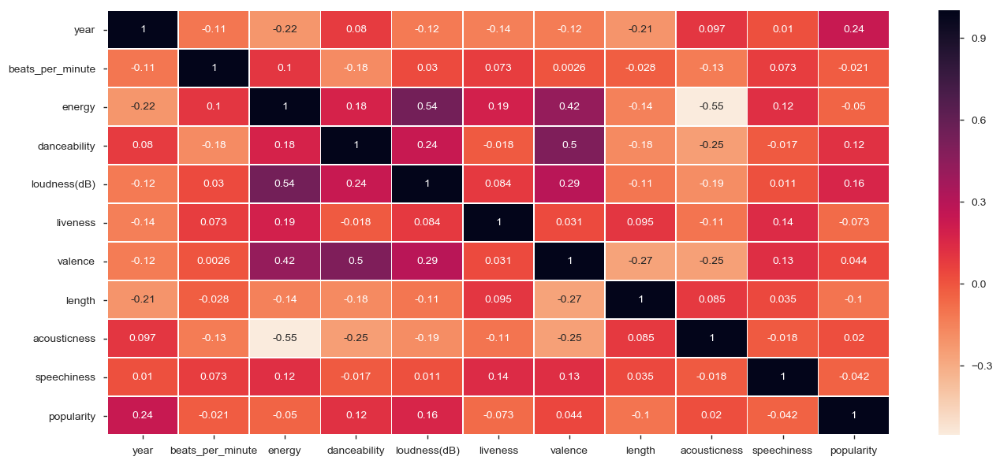

In [32]:
# Generate a heatmap to visualize the correlation between continuous variables
plt.figure(figsize=(16,7))

corrMatrix = data.corr()
sns.heatmap(corrMatrix, annot=True, linewidths=.5, cmap = sns.cm.rocket_r);

**Observations:** <br/>
- There is high positive correlation between popularity and year, valence and energy, valence and danceability, and valence and loudness. To address this in the future, we may need to remove valence as a variable.
- There is high negative correlation between acousticness and energy

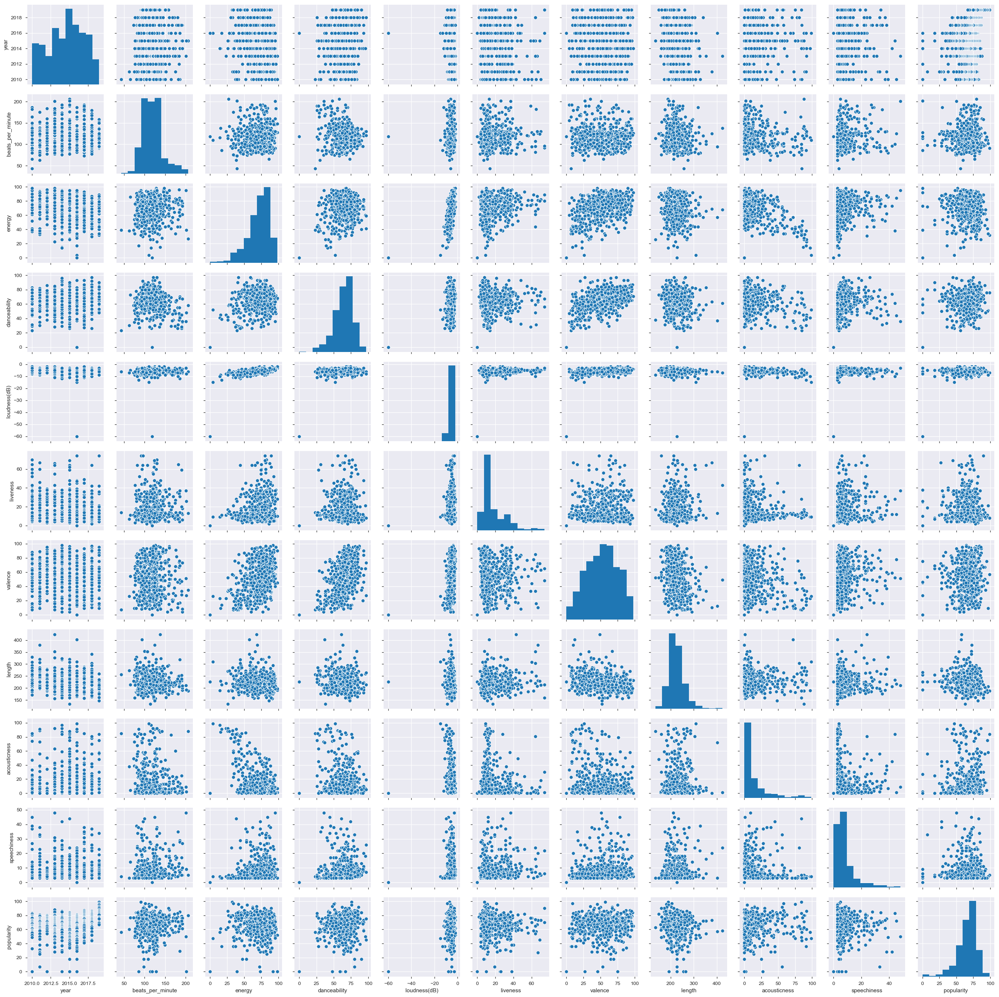

In [33]:
# pairplot to show the distributions and relationships between the features
sns.pairplot(data)
plt.show()

Loudness is skewed so we will need to scale it before any machine learning. We saw from our correlation heatmap that energy and acousticness were negatively correlated. Let's visualize the relationship between those two variables using a lineplot from the seaborn package.

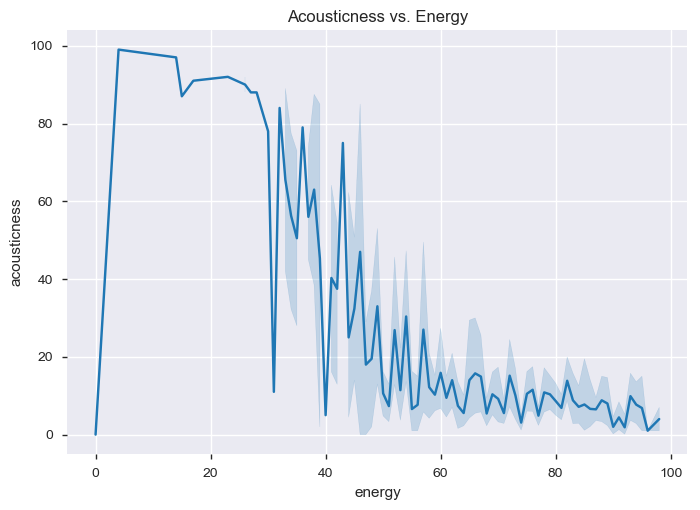

In [35]:
sns.lineplot(x="energy", y="acousticness", data=data).set_title('Acousticness vs. Energy');

Acousticness and energy seem to have an inverse relationship where the energy tends to be lower with a higher acoustic score and vice versa. This makes sense since acoustic songs tend to be more intimate. <br/>
<br/>
Let's also have a look at the liveness values. Liveness is the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 80 provides strong likelihood that the track is live. 

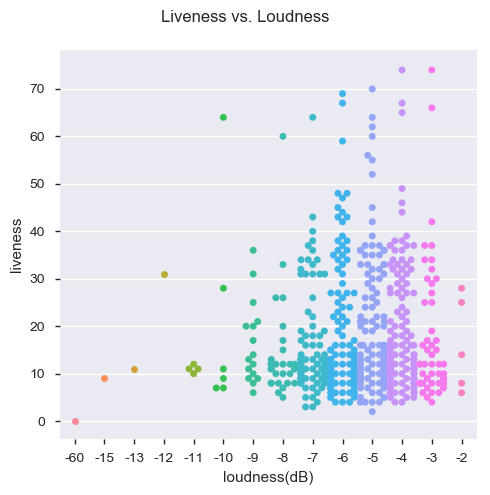

In [45]:
g = sns.catplot(y="liveness", x="loudness(dB)", kind="swarm", data=data)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Liveness vs. Loudness');

The majority of the tracks were most likely not performed live. The most tracks seem to fall within the decible range -3 to -7 decibles (loudness).

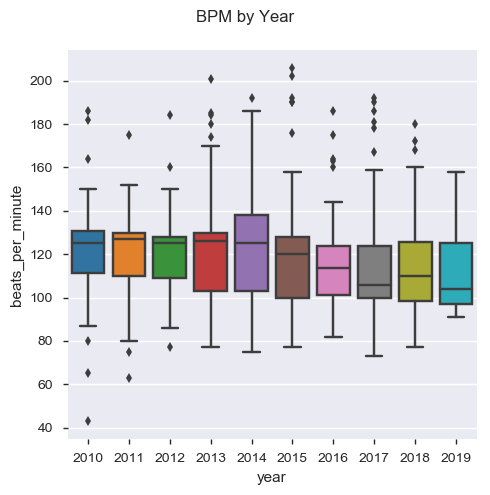

In [47]:
g = sns.catplot(y="beats_per_minute", x="year", kind="box", data=data)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('BPM by Year');

The median beats per minute for popular songs is trending down throughout the decade.

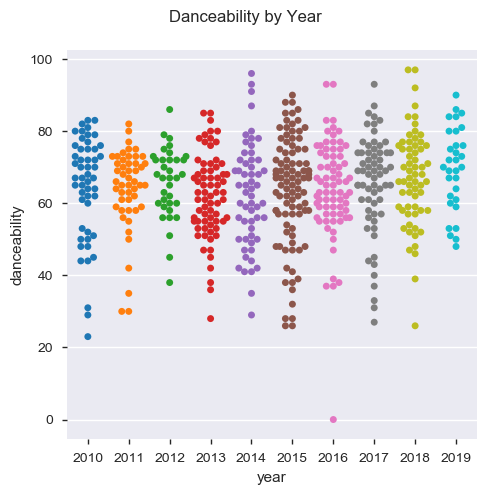

In [48]:
g = sns.catplot(y="danceability", x="year", kind="swarm", data=data)
plt.subplots_adjust(top=0.9)
g.fig.suptitle('Danceability by Year');

Most popular songs tend to be in the 60 - 80 danceability range. The danceability is trending upwards throughout the decade.

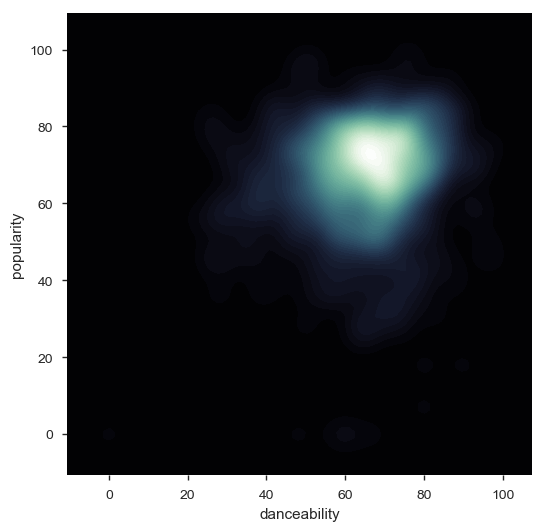

In [49]:
# Looking at the relationship between danceability and popularity
f, ax = plt.subplots(figsize=(6, 6))
cmap = sns.cubehelix_palette(rot=-.4, as_cmap=True, dark=0, light=1, reverse=True)
sns.kdeplot(data.danceability, data.popularity, cmap=cmap, n_levels=60, shade=True);

The most popular songs tend to be around 60-80 in danceability, which is pretty high!

The spearman correlation is:   0.478548926706185


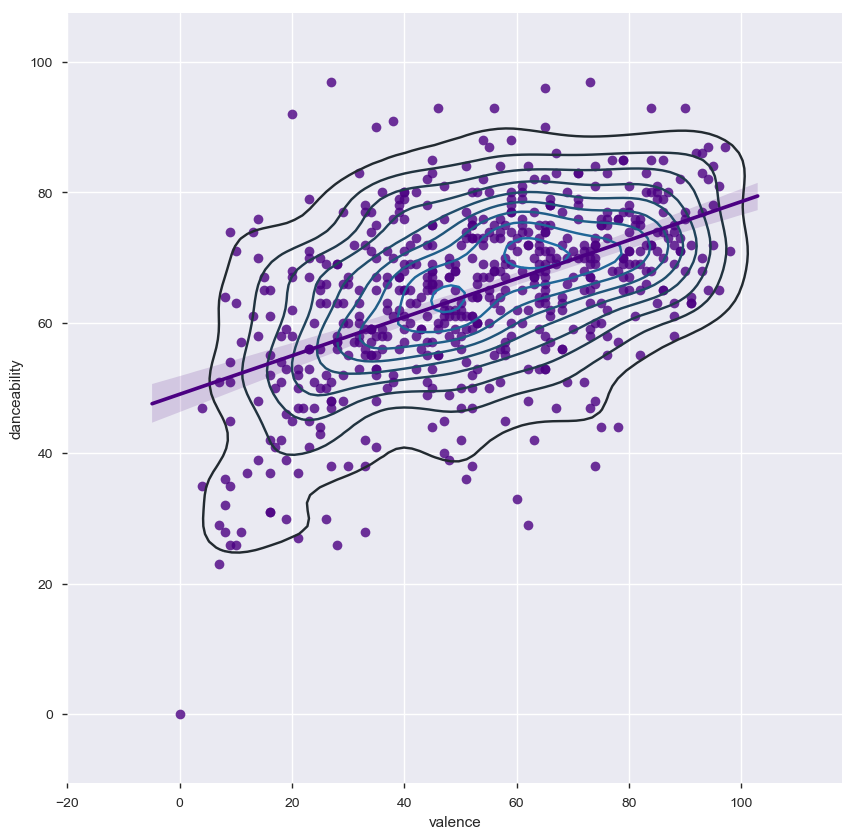

In [50]:
# Analysing the relationship between Danceablity and Valence
correlation = data.corr(method='spearman')

fig = plt.subplots(figsize = (10,10))

sns.regplot(x = 'valence', y = 'danceability', data = data, color = 'indigo')

sns.kdeplot(data['valence'], data['danceability'])

print('The spearman correlation is:  ',correlation['danceability']['valence'])

We can see that happier songs are more danceable!

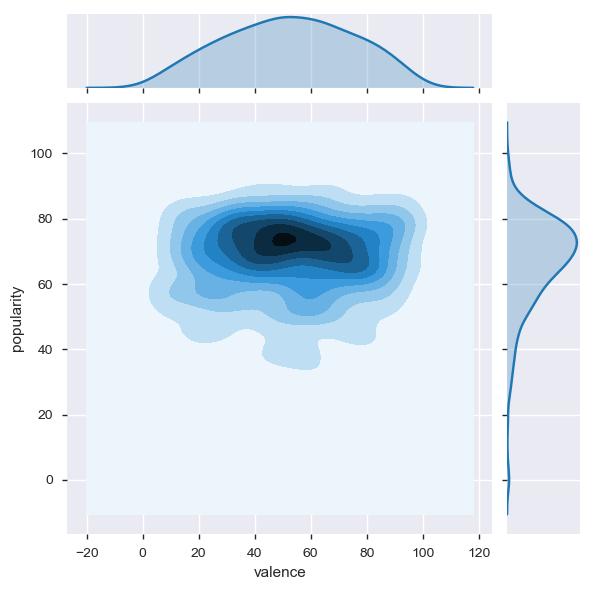

In [51]:
# Let's look at the relationship between valence and popularity
sns.jointplot(x=data.valence, y=data.popularity, data=data, kind="kde");

We can see that the valence for most popular songs is between 40-60. This means that the majority of tracks are not super cheerful or really sad. The energy is mid-range.

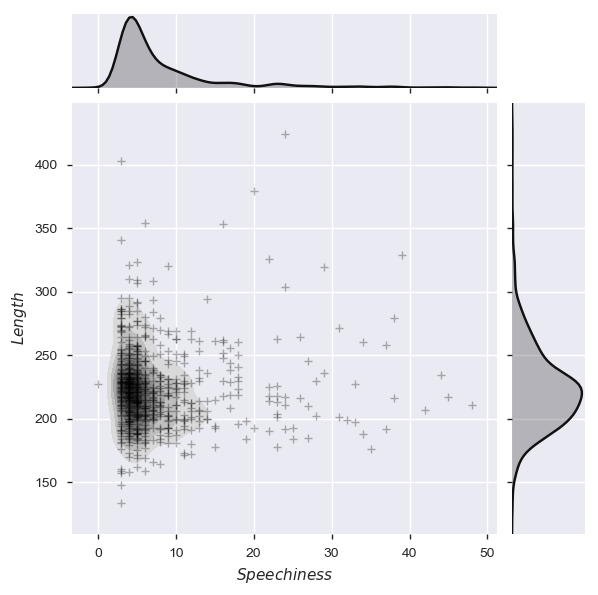

In [53]:
# Looking at the speechiness vs. length of the track
g = sns.jointplot(x=data.speechiness, y=data.length, data=data, kind="kde", color="k")
g.plot_joint(plt.scatter, c="black", alpha=0.3, s=30, linewidth=1, marker="+")
g.ax_joint.collections[0].set_alpha(0)
g.set_axis_labels("$Speechiness$", "$Length$");

The majority of popular songs are 3 1/2 to 4 minutes long (~200-250 seconds). Values below 0.33 most likely represent music and other non-speech-like tracks. 

Now let's have a look at our categorical data in the form of a wordcloud:

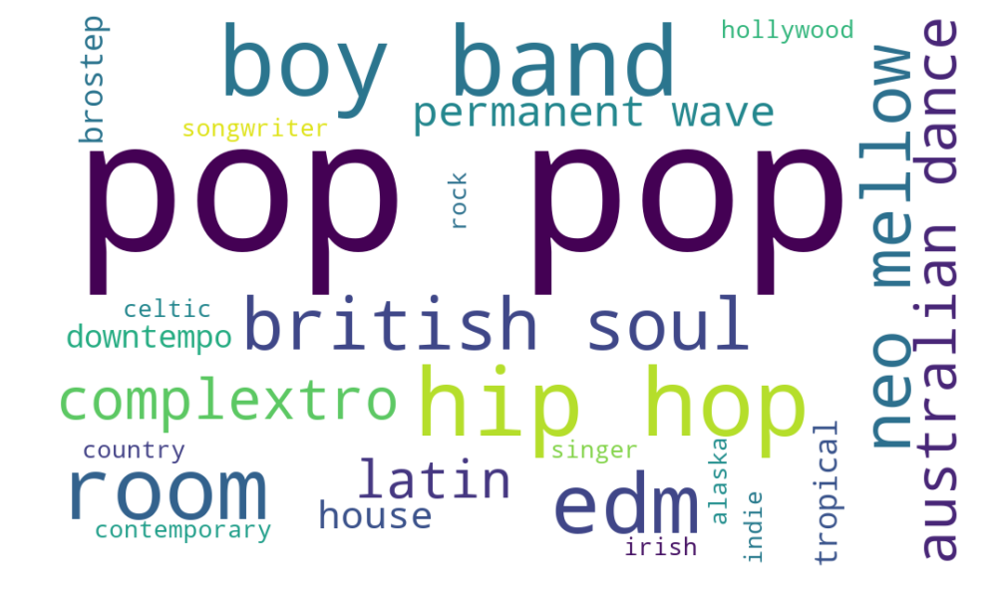

In [54]:
Sptfy_wordcloud = WordCloud(width = 1000, height = 600, max_font_size = 200, max_words = 150,
                      background_color='white').generate(" ".join(data.top_genre))

plt.figure(figsize=[12,12])
plt.imshow(Sptfy_wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

Now that we have visualized the relationships between the different song features, let's have a look at the artists and who had the most hit tracks from 2010-2019.

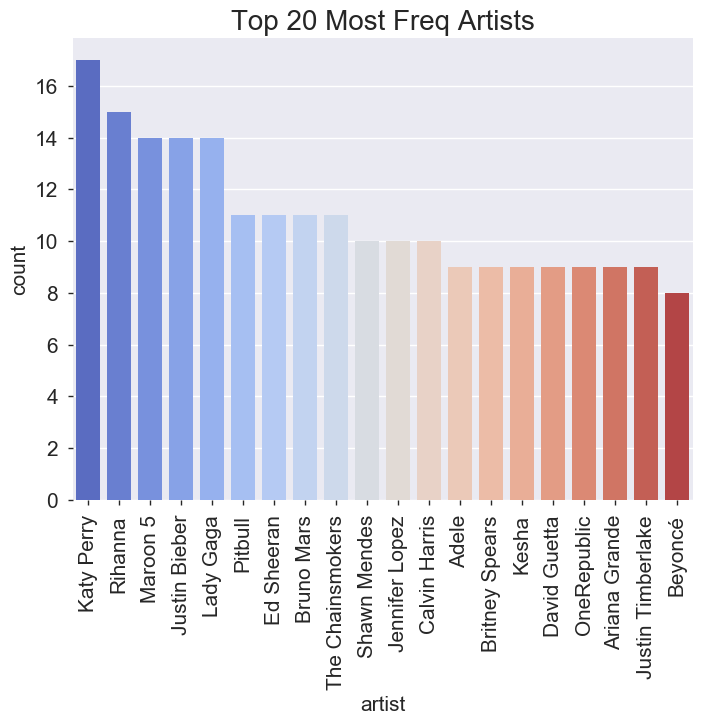

In [56]:
# bar plot of topm 20 most frequent artists to have hit tracks from 2010-2019
plt.figure(figsize=(8, 6))
plt.title('Top 20 Most Freq Artists',fontsize=20)
plt.xlabel('Artist', fontsize=15)
plt.ylabel('Count', fontsize=15)

sns.countplot(data.artist,order=pd.value_counts(data.artist).iloc[:20].index,palette=sns.color_palette("coolwarm", 20))

plt.xticks(size=15,rotation=90)
plt.yticks(size=15)
sns.despine(bottom=True, left=True)
plt.show()

Katy Perry had the most hits in the past decade with 17! She was closely followed by Rihanna and Justin Bieber/Lady Gaga/Maroon 5. Now let's have a look at which tracks were the most popular during this time. 

In [57]:
# grab the top 20 most popular tracks
top20_df = data.nlargest(20,['popularity'])
top20_df.head()

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
572,Memories,Maroon 5,pop,2019,91.0,32,76,-7,8,57,189,84,5,99
573,Lose You To Love Me,Selena Gomez,pop,2019,102.0,34,51,-9,21,9,206,58,4,97
574,Someone You Loved,Lewis Capaldi,pop,2019,110.0,41,50,-6,11,45,182,75,3,96
575,Señorita,Shawn Mendes,pop,2019,117.0,54,76,-6,9,75,191,4,3,95
576,How Do You Sleep?,Sam Smith,pop,2019,111.0,68,48,-5,8,35,202,15,9,93


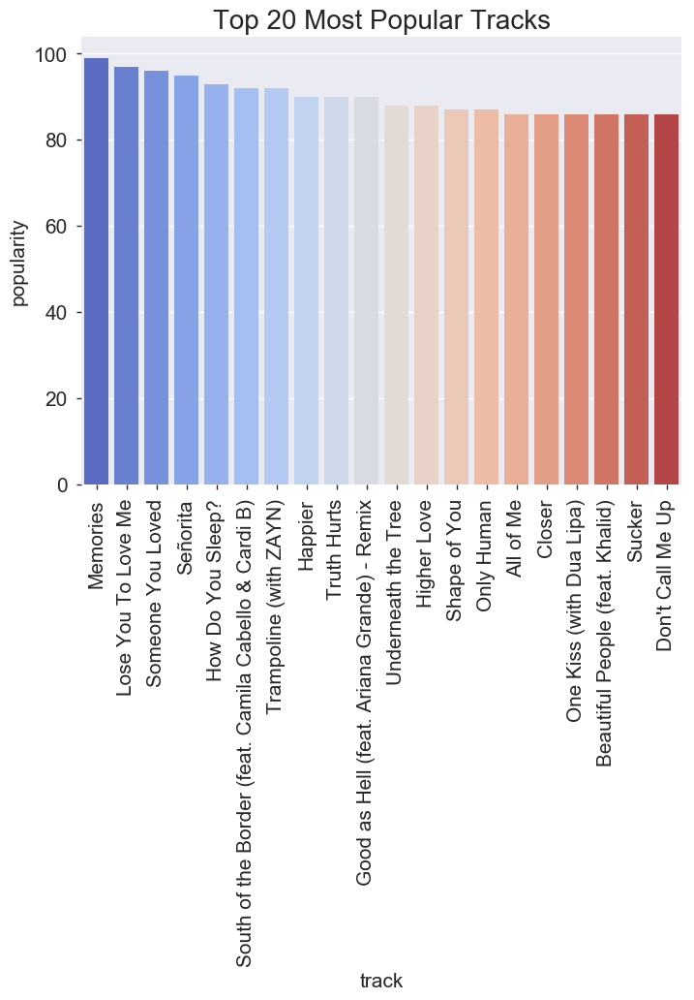

In [58]:
# bar plot of top 20 most popular tracks
plt.figure(figsize=(8,6))
plt.title('Top 20 Most Popular Tracks',fontsize=20)
plt.xlabel('Track', fontsize=15)
plt.ylabel('Popularity', fontsize=15)

sns.barplot(top20_df.track, top20_df.popularity, palette=sns.color_palette("coolwarm",20))

plt.xticks(size=15,rotation=90)
plt.yticks(size=15)
sns.despine(bottom=True, left=True)
plt.show()

Now let's look at our top artists and how many hits they produced each year of the decade.

In [59]:
# the track count of the top 10 artists
artists = data['artist'].value_counts().reset_index().head(10)
print(artists)

              index  artist
0        Katy Perry      17
1           Rihanna      15
2          Maroon 5      14
3     Justin Bieber      14
4         Lady Gaga      14
5           Pitbull      11
6        Ed Sheeran      11
7        Bruno Mars      11
8  The Chainsmokers      11
9      Shawn Mendes      10


In [60]:
# create table showing the number of tracks by each artist per year
frames = []
topArtists = data['artist'].value_counts().head(10).index
for i in topArtists:
     frames.append(data[data['artist'] == i])
        
resultArtist = pd.concat(frames)
artistsYear = pd.crosstab(resultArtist["artist"], resultArtist["year"], margins=False)
artistsYear

year,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
artist,,,,,,,,,,
Bruno Mars,2,1,2,0,3,0,0,2,1,0
Ed Sheeran,0,0,0,0,0,4,0,1,1,5
Justin Bieber,1,0,2,1,0,9,0,0,1,0
Katy Perry,2,3,3,1,3,1,1,3,0,0
Lady Gaga,3,5,0,1,1,0,2,1,1,0
Maroon 5,1,1,2,2,1,2,0,1,2,2
Pitbull,0,1,2,2,1,3,0,2,0,0
Rihanna,2,4,3,1,0,2,2,0,1,0
Shawn Mendes,0,0,0,0,0,1,2,2,4,1


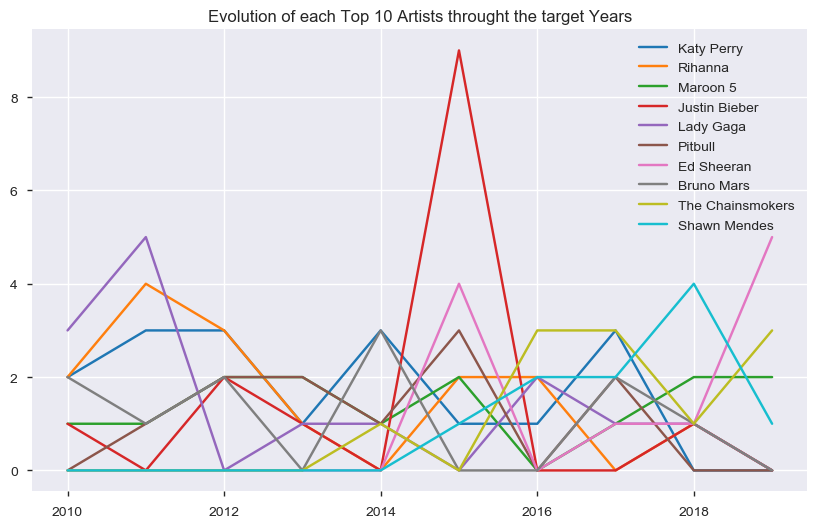

In [61]:
# line plot showing the number of tracks by the top 10 artists each year
plt.figure(figsize=(10,6))
for i in artists['index']:
    tmp = []
    for y in range(2010,2020):
        songs = data[data['year'] == y][data['artist'] == i]
        tmp.append(songs.shape[0])
    sns.lineplot(x=list(range(2010,2020)),y=tmp)
plt.legend(list(artists['index']))
plt.title("Evolution of each Top 10 Artists throught the target Years");

We can see that 2015 was a huge year for Justin Bieber due to his release of his much anticipated fourth studio album 'Purpose'. Ed Sheeran had a peak in 2015 for his album 'Multiply' and finished the decade strong with the release of his album 'Divide'.
<br/><br/>
Let's visualize the different genres that composed our top songs of the decade. 

In [62]:
# ratio = pd.DataFrame(gen_genre_data['general_genre'].value_counts())
# ratio.rename(columns={"general_genre": "Count"},inplace=True)
# ratio['general_genre'] = ratio.index
# ratio['Ratio'] = ratio['Count']/ratio['Count'].sum() #Add count ratio for each genre
# ratio.head()

In [63]:
ratio = pd.DataFrame(data['top_genre'].value_counts())
ratio.rename(columns={"top_genre": "Count"},inplace=True)
ratio['top_genre'] = ratio.index
ratio['Ratio'] = ratio['Count']/ratio['Count'].sum() #Add count ratio for each genre
ratio.head()

,Count,top_genre,Ratio
pop,483,pop,0.822828
boy band,15,boy band,0.025554
hip hop,14,hip hop,0.023850
room,12,room,0.020443
edm,11,edm,0.018739


In [64]:
ratio['Ratio'] = ratio['Ratio'].astype(float)

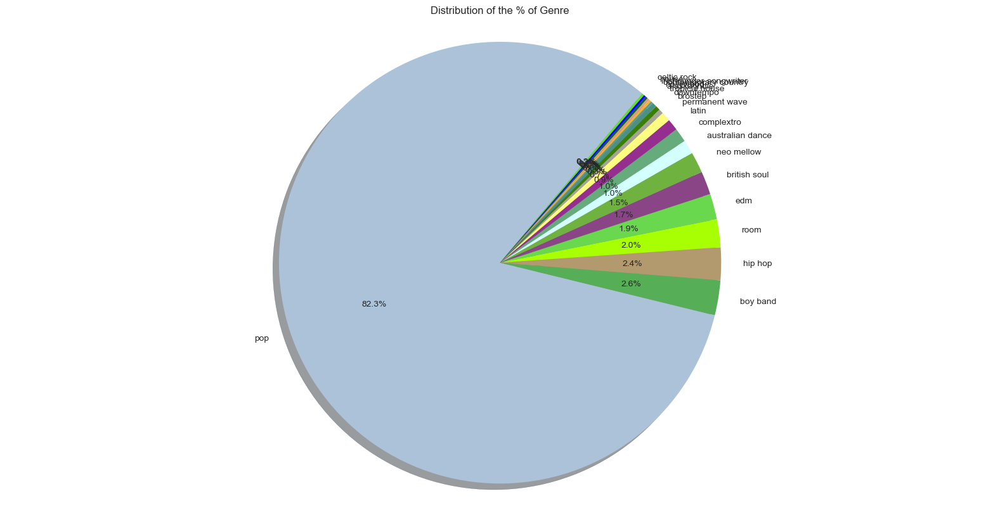

In [65]:
import matplotlib.colors as colors
labels_list = ratio['top_genre']
colors_list = list(colors._colors_full_map.values())

# Plot
plt.figure(figsize=(20,10))
plt.pie(ratio['Ratio'], colors=colors_list[0:25],
autopct='%1.1f%%', shadow=True, startangle=50,
       labels=labels_list)

plt.axis('equal')
plt.title('Distribution of the % of Genre')
plt.show()

The overwhelming majority of songs are dance pop! Now let's take a quick look at the bpm, valence, and acousticness of all the tracks in one plot!

In [66]:
# Plotly plot that shows the beats per minute and valence of each track every year from 2010-2019. The size of the bubble
# is the acousticness of the song and the color depicts the general genre of the track.
fig = px.scatter(gen_genre_data, x="beats_per_minute", y="valence",size='acousticness'
                 ,color="general_genre", animation_frame="year")
fig.show()

Now let's have a look at how each song feature has trended over the past decade.

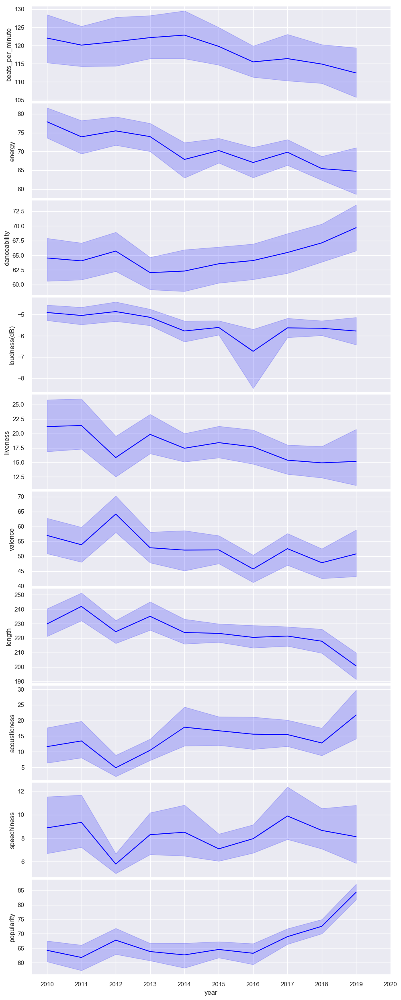

In [67]:
# PairGrid to analyze trends over the years

sns.set()

g = sns.PairGrid(data, y_vars = ['beats_per_minute', 'energy', 'danceability', 'loudness(dB)', 
                               'liveness', 'valence', 'length', 'acousticness', 'speechiness', 'popularity'] , x_vars = ['year'], aspect = 4)

g = g.map(sns.lineplot, color="blue")

# Adjust the tick positions and labels

g.set(xticks=[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])


# Adjust the arrangement of the plots

g.fig.subplots_adjust(wspace=.02, hspace=.02);

In general, hit songs are showing:
 - a slightly downward trend in beats per minute (becoming slower)
 - have less energy
 - becoming way more danceable
 - becoming a little louder
 - becoming slightly happier
 - are shorter
 - becoming more acoustic
 - with less speech

# Clustering 

We will use three different clustering algorithms to group songs with similar attributes. We will be using K-Means, DBScan, and Agglomerative Clustering. A cluster is a collection of data points aggregated together because of certain similarities. 

**K-Means** clustering is one of the most popular unsupervised machine learning techniques which groups similar data points together to discover underlying patterns. 

**DBScan** stands for Density-Based Spatial clustering of applications with noise and it groups together points that are close to each other based on a distance measurement (usually Euclidean distance) and a minimum number of points. It also marks as outliers the points that are in low-density regions. 

**Agglomerative Clustering** is a bottom-up hierarchal algorithm. Bottom-up algorithms treat each document as a singleton cluster at the outset and then successively merge (or agglomerate) pairs of clusters until all clusters have been merged into a single cluster that contains all documents. 
<br/> <br/> 
These techniques can be extremely useful for:
<br/>
- Targeted marketing efforts
- Creating recommendations for users based on tracks they like.
- Deriving new features for more complex machine learning models

First, let's do K-means clustering on our original data which included all of the sub-genres.

## K-means clustering with all subgenres

In [26]:
# one hot-encoding of categorical features 
temp_df = pd.get_dummies(data[['artist', 'top_genre']])
data_1 = data.join(temp_df, how='left')
data_1 = data_1.drop(columns = ['artist', 'top_genre', 'track'], axis=1)
data_1.shape # look at the shape of our data - we have 215 features now

(587, 215)

Now we have to check for collinearity and reduce dimensionality using principal component analysis (PCA). First, we have to standardize the data because the features are not normally distributed. It is necessary to standardize before PCA so all variables have the same standard deviation, thus all variables have the same weight and the PCA calculates relevant axis.
<br/><br/>
We will use standard scaler to standardize our data. StandardScaler results in a distribution with a standard deviation equal to 1. The variance is equal to 1 also, because variance = standard deviation squared. And 1 squared = 1.
StandardScaler makes the mean of the distribution 0.

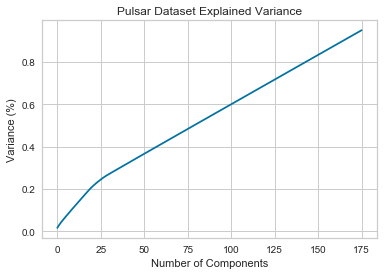

In [27]:
# Standardize the data so it is all on the same scale
X_std = StandardScaler().fit_transform(data_1)

# Run PCA on normalized data
pca = PCA(n_components=.95)
principalComponents = pca.fit_transform(X_std) # Plot the explained variances

#Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Pulsar Dataset Explained Variance')
plt.show()

In [28]:
# using 25 because the elbow plot 'bent' around 25
pca = PCA(n_components=25) 
principalComponents = pca.fit_transform(X_std)
pca_df = pd.DataFrame(principalComponents)

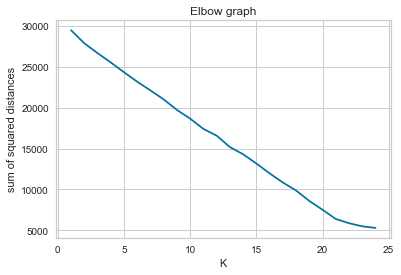

In [29]:
#Plot sum of squared distances
sum_of_squared_distances = []
K = range(1,25) # because 25 is the number of components
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(pca_df)
    sum_of_squared_distances.append(km.inertia_)
    
ax = sns.lineplot(x=K, y = sum_of_squared_distances)
ax.set(xlabel='K', ylabel='sum of squared distances', title='Elbow graph');

In [30]:
kmeans = KMeans(n_clusters=21)   # picked 21 because the elbow bends at approx 21  
kmeans.fit(pca_df) #fit our pca data to our kmeans clustering model

y_kmeans = kmeans.predict(pca_df) # predict the clusters
y_kmeans

array([ 9, 10,  0,  0,  0,  4,  0,  0,  1,  0,  0,  0,  0,  0,  0, 10,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  1,
        0,  0,  1,  0,  0,  1,  0,  1,  0,  0,  1,  0,  0, 10, 10,  0, 17,
        1,  7,  0,  7,  0,  0,  0,  1,  0,  0,  0, 10,  1,  0,  0,  0,  0,
        1,  0,  0,  0,  0,  0,  1,  0,  0,  0,  0,  1,  0,  0,  0,  0,  0,
        1,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        6,  0,  5,  4,  4,  0,  7,  4,  0,  0,  0,  0,  0,  5,  0,  0,  0,
        4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
       17,  5,  1,  8,  0,  1, 17,  2,  1,  1,  0,  0,  0, 16,  1,  0,  0,
       10,  5,  5,  0,  2,  0,  0,  0,  0,  1,  1,  4,  1,  4,  1,  1,  0,
        0,  0,  0,  0,  0,  5,  0,  1,  1,  1,  0,  1,  1,  1,  4,  0,  5,
        6,  0,  1,  0,  1,  0,  5,  0,  0,  0,  0,  0,  0,  0,  0, 11,  0,
       10,  9,  1,  0,  0,  0,  0,  0, 17,  4,  0,  1,  4,  0,  4,  1,  1,
        1,  4,  1,  5, 10

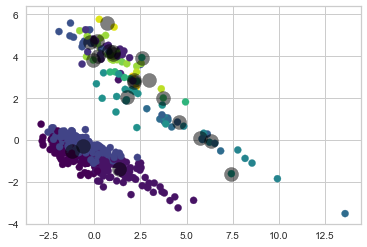

In [31]:
# Plot the clusters 
plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

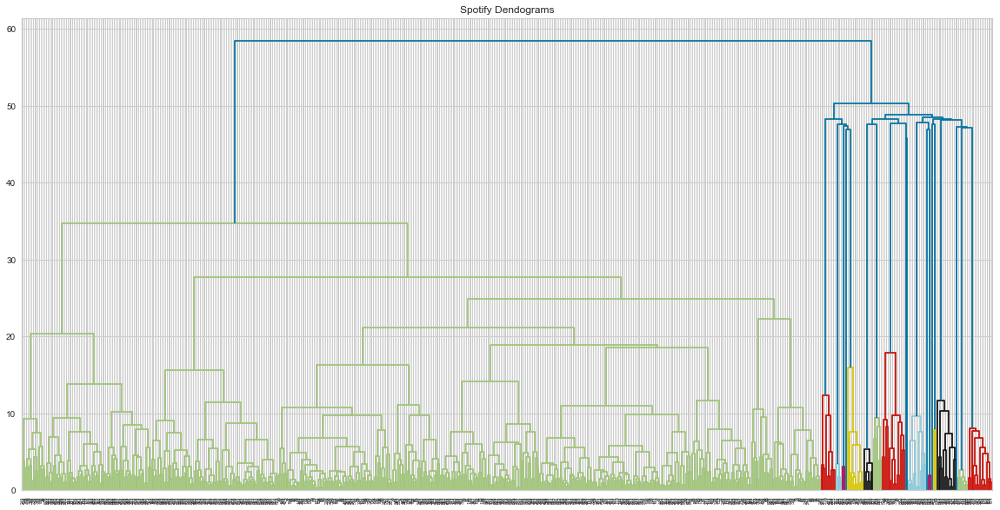

In [32]:
# Plot dendrogram of pca data 
plt.figure(figsize=(20, 10))
plt.title("Spotify Dendograms")
dendogram = dendrogram(linkage(pca_df, method='ward'))

## Agglomerative Clustering with all subgenres

In [33]:
# Agglomerative Cluster - this recursively merges the pair of clusters that minimally increases a given linkage distance.
ac = AgglomerativeClustering(n_clusters=21, affinity='euclidean', linkage='ward')
ac.fit_predict(pca_df)

array([ 6,  4,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  4,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        0,  0,  1,  0,  0,  1,  0,  0,  0,  0,  1,  0,  0,  4,  4,  0,  3,
        1,  2,  0,  2,  0,  0,  0,  0,  0,  0,  0,  4,  0,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        1,  0,  0,  0,  0,  0,  1,  1,  0,  0,  0,  0,  0,  0,  0,  0,  0,
       11,  0,  7,  0,  0,  0,  2,  0,  0,  0,  0,  0,  0,  7,  0,  0,  0,
        0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,  0,
        3,  7,  0, 15,  0,  1,  3,  9,  1,  0,  0,  0,  0, 16,  1,  0,  0,
        4,  7,  7,  0,  9,  0,  0,  0,  0,  1,  0,  0,  1,  0,  0,  0,  0,
        0,  0,  0,  0,  0,  7,  0,  1,  0,  1,  0,  1,  0,  0,  0,  0,  7,
       11,  0,  0,  0,  0,  0,  7,  0,  0,  0,  0,  0,  0,  0,  0, 17,  0,
        4,  6,  1,  0,  0,  0,  0,  0,  3,  0,  0,  1,  0,  0,  0,  0, 19,
        1,  0,  0,  7,  4

## DBScan with all subgenres

In [34]:
# Use density based spatial clustering of applications with noise (dbscan) 
# documentation can be found here: https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html

dbscan = DBSCAN(eps = 9, min_samples = 3)
dbscan.fit(pca_df)
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print('Estimated number of clusters: %d' % n_clusters_)

Estimated number of clusters: 10


In [35]:
kmeans_labels = pd.DataFrame(kmeans.labels_)
ac_labels = pd.DataFrame(ac.labels_)
dbscan_labels = pd.DataFrame(dbscan.labels_)

print(silhouette_score(pca_df, kmeans_labels, metric='euclidean'))
print(silhouette_score(pca_df, ac_labels, metric='euclidean'))
print(silhouette_score(pca_df, dbscan_labels, metric='euclidean'))

0.20129658222817975
0.23967013697112352
0.5512109981987564


DBscan had the highest silhouette score so we will use those cluster labels.

In [36]:
# add dbscan to data
dbscan_df = data.join(dbscan_labels, how='left')
dbscan_df = dbscan_df.rename(columns = {0: 'labels'})
dbscan_df.head()

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity,labels
0,"Hey, Soul Sister",Train,neo mellow,2010,97.0,89,67,-4,8,80,217,19,4,83,0.0
1,Love The Way You Lie,Eminem,hip hop,2010,87.0,93,75,-5,52,64,263,24,23,82,1.0
2,TiK ToK,Kesha,pop,2010,120.0,84,76,-3,29,71,200,10,14,80,2.0
3,Bad Romance,Lady Gaga,pop,2010,119.0,92,70,-4,8,71,295,0,4,79,2.0
4,Just the Way You Are,Bruno Mars,pop,2010,109.0,84,64,-5,9,43,221,2,4,78,2.0


In [37]:
df_scaled = pd.DataFrame(data)
df_scaled['dbscan'] = dbscan.labels_
df_mean = (df_scaled.loc[df_scaled.dbscan!=-1, :].groupby('dbscan').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])

for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
    selected_columns = list(results.sort_values('Var', ascending=False,).head(7).Variable.values) + ['dbscan']
    tidy = df_scaled[selected_columns].melt(id_vars='dbscan')

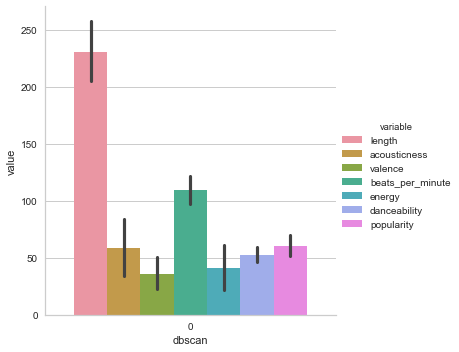

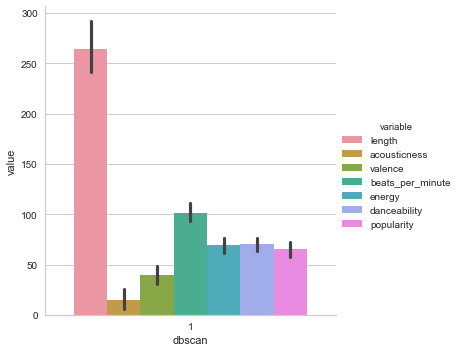

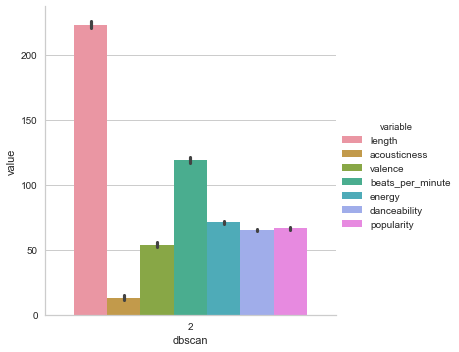

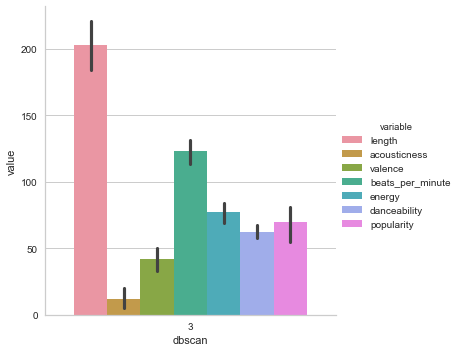

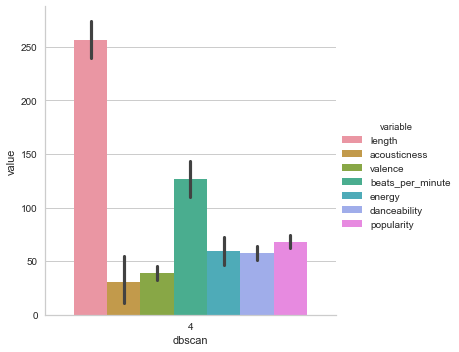

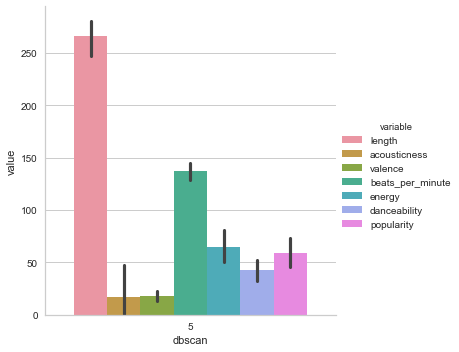

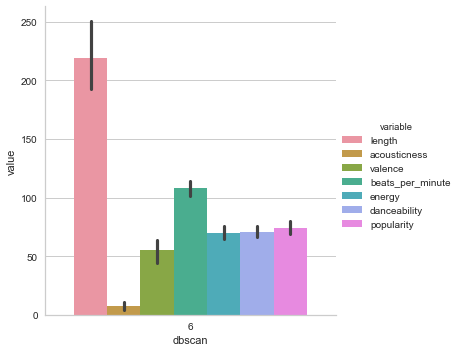

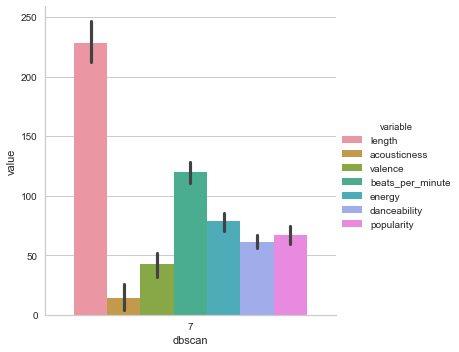

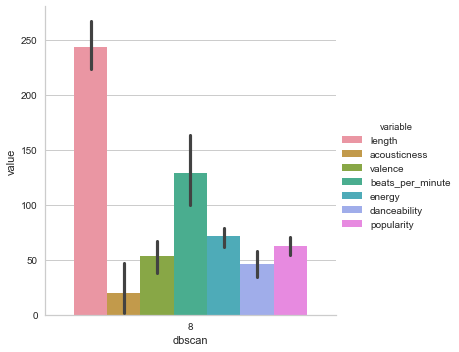

In [38]:
# 10 is the number of clusters in DBScan
# Plot shows the mean attribute scores of each cluster
# We use range 9 bc it is the number of estimated clusters obtained from the dbscan

for i in range(9):
    sns.catplot(x='dbscan', y='value', hue='variable', data=tidy[tidy['dbscan']==i], height=5, aspect=1, kind='bar')

We can see that the songs from our data have been classified into four major clusters based on their song attributes.
<br/> <br/>
> **Our Clusters:**<br/>
> 0 - Highly acoustic, low energy, sadder, not very danceable, slow <br/>
> 1 - Cheerful, high energy, high danceability, fast <br/>
> 2 - Long songs, Relatively acoustic, mid energy, not very danceability, high bpm <br/>
> 3 - Long songs, sad, not very acoustic, low danceability, mid energy, high danceability <br/>
> 4 - Most popular songs, upbeat, high energy, not acoustic, high danceability  <br/>
> 5 - Not very acoustic, popular, upbeat, mid energy and danceability  <br/>
> 6 - chill, high bpm, danceable, high energy <br/>
> 7 - long songs, acoustic, cheerful, mid energy, low danceability  <br/>
> 8 - Fast paced (high bpm), cheerful, very danceable, high energy <br/>


Now let's do the same for our data which consolidated the genres into more general groups.

## K-means clustering with general genres

In [39]:
# one hot encoding of the dataset
temp_df = pd.get_dummies(gen_genre_data[['artist', 'general_genre']])
gen_genre_data_2 = gen_genre_data.join(temp_df, how='left')
gen_genre_data_2 = gen_genre_data_2.drop(columns = ['artist', 'general_genre', 'track'], axis=1)

# check shape
gen_genre_data_2.shape

(587, 201)

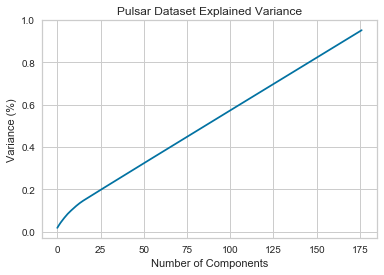

In [40]:
# normalize the data using standard scaler and implement pca
X_std = StandardScaler().fit_transform(gen_genre_data_2)
pca = PCA(n_components=.95)
principalComponents = pca.fit_transform(X_std) # Plot the explained variances

#Plotting the Cumulative Summation of the Explained Variance
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Pulsar Dataset Explained Variance')
plt.show()

In [41]:
# use n_components = 10 because that is where the elbow is
pca = PCA(n_components=10)
principalComponents = pca.fit_transform(X_std)
pca_df = pd.DataFrame(principalComponents)

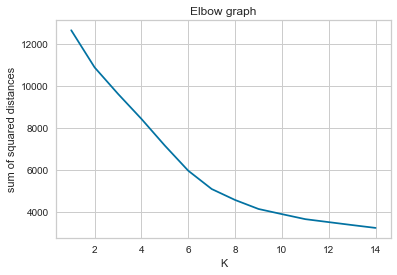

In [42]:
# plot sum of squared distances to find optimal k
sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(pca_df)
    sum_of_squared_distances.append(km.inertia_)
    
ax = sns.lineplot(x=K, y = sum_of_squared_distances)
ax.set(xlabel='K', ylabel='sum of squared distances', title='Elbow graph');

In [43]:
kmeans = KMeans(n_clusters=7)    # chose 7 since elbow bends at k=7
kmeans.fit(pca_df)
y_kmeans = kmeans.predict(pca_df)
y_kmeans

array([6, 2, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 4, 0, 4, 0, 0,
       4, 0, 0, 2, 2, 0, 1, 4, 6, 0, 6, 0, 0, 0, 4, 0, 0, 0, 2, 4, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0,
       0, 0, 0, 4, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 0, 0, 4, 0, 0, 6, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 1, 4, 4, 3, 0, 4, 1, 1, 4, 4, 0, 0, 0, 1, 4, 0, 0, 2,
       0, 0, 0, 1, 0, 0, 0, 0, 4, 4, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 4, 0, 4, 0, 4, 0, 0, 0, 0, 0, 3, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 6, 0, 2, 6, 4, 0, 0, 0, 0, 0, 1, 0, 0, 4, 0, 0, 4, 4,
       1, 4, 0, 4, 0, 2, 0, 4, 4, 4, 0, 0, 0, 0, 0, 4, 0, 0, 1, 0, 6, 0,
       0, 6, 3, 0, 1, 0, 0, 6, 0, 0, 0, 0, 6, 6, 0, 4, 0, 4, 0, 0, 4, 4,
       4, 4, 4, 4, 0, 4, 4, 4, 4, 4, 0, 0, 0, 1, 4, 0, 4, 4, 0, 0, 0, 4,
       0, 1, 4, 6, 0, 0, 4, 0, 0, 4, 4, 0, 0, 0, 6,

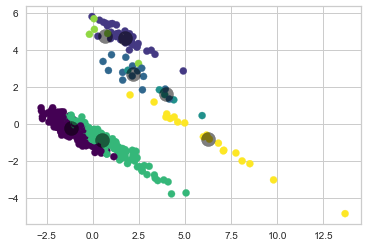

In [44]:
# plot the clusters and cluster nodes
plt.scatter(pca_df.iloc[:, 0], pca_df.iloc[:, 1], c=y_kmeans, s=50, cmap='viridis')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

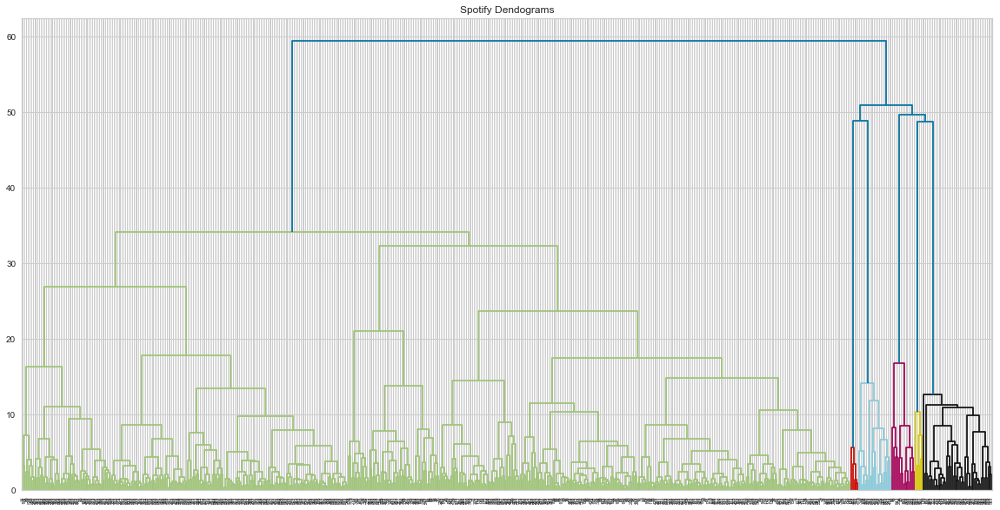

In [45]:
# Plot dendrogram
plt.figure(figsize=(20, 10))
plt.title("Spotify Dendograms")
dendogram = dendrogram(linkage(pca_df, method='ward'))

## Agglomerative Clustering with general genres

In [46]:
ac = AgglomerativeClustering(n_clusters=7, affinity='euclidean', linkage='ward')
ac.fit_predict(pca_df)

array([6, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 3, 0, 6, 0, 6, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 2, 0, 0, 2, 0, 0, 2, 0, 0, 4, 0, 0, 2, 0, 0, 6, 0,
       0, 0, 0, 2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 3, 0, 2, 4, 0, 0, 3, 3, 2, 0, 2, 0, 0, 3, 0, 0, 0, 1,
       0, 0, 0, 3, 0, 0, 2, 0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 2, 0, 2, 0, 0,
       0, 0, 0, 0, 6, 0, 1, 6, 2, 0, 0, 0, 0, 0, 3, 2, 2, 0, 2, 0, 2, 0,
       3, 0, 2, 0, 0, 1, 2, 0, 0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 3, 0, 6, 0,
       0, 6, 4, 2, 3, 0, 0, 6, 0, 2, 0, 0, 6, 6, 0, 0, 0, 0, 2, 0, 2, 2,
       2, 0, 2, 0, 2, 2, 0, 0, 2, 2, 2, 2, 2, 3, 2, 0, 0, 0, 0, 0, 2, 2,
       2, 3, 2, 6, 2, 0, 2, 2, 0, 2, 2, 2, 2, 2, 6,

## DBScan with general genres

In [47]:
# implement dbscan on pca data
dbscan = DBSCAN(eps = 9, min_samples = 3)
dbscan.fit(pca_df)
labels = dbscan.labels_

# Number of clusters in labels, ignoring noise
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
print('Estimated number of clusters: %d' % n_clusters_)

Estimated number of clusters: 4


In [48]:
kmeans_labels = pd.DataFrame(kmeans.labels_)
ac_labels = pd.DataFrame(ac.labels_)
dbscan_labels = pd.DataFrame(dbscan.labels_)

print(silhouette_score(pca_df, kmeans_labels, metric='euclidean'))
print(silhouette_score(pca_df, ac_labels, metric='euclidean'))
print(silhouette_score(pca_df, dbscan_labels, metric='euclidean'))

0.230203588309105
0.18613300508083133
0.5684387756513951


DBScan has the best silhouette score again, so we will use those labels as our clusters.

In [49]:
# add labels to data
dbscan_df = gen_genre_data.join(dbscan_labels, how='left')
dbscan_df = dbscan_df.rename(columns = {0: 'labels'})
dbscan_df.head()

,track,artist,general_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity,labels
0,"Hey, Soul Sister",Train,indie,2010,97.0,89,67,-4,8,80,217,19,4,83,0.0
1,Love The Way You Lie,Eminem,hip hop,2010,87.0,93,75,-5,52,64,263,24,23,82,1.0
2,TiK ToK,Kesha,pop,2010,120.0,84,76,-3,29,71,200,10,14,80,0.0
3,Bad Romance,Lady Gaga,pop,2010,119.0,92,70,-4,8,71,295,0,4,79,0.0
4,Just the Way You Are,Bruno Mars,pop,2010,109.0,84,64,-5,9,43,221,2,4,78,0.0


In [50]:
df_scaled = pd.DataFrame(gen_genre_data)
df_scaled['dbscan'] = dbscan.labels_
df_mean = (df_scaled.loc[df_scaled.dbscan!=-1, :].groupby('dbscan').mean())
results = pd.DataFrame(columns=['Variable', 'Var'])
for column in df_mean.columns[1:]:
    results.loc[len(results), :] = [column, np.var(df_mean[column])]
    selected_columns = list(results.sort_values('Var', ascending=False,).head(7).Variable.values) + ['dbscan']
    tidy = df_scaled[selected_columns].melt(id_vars='dbscan')

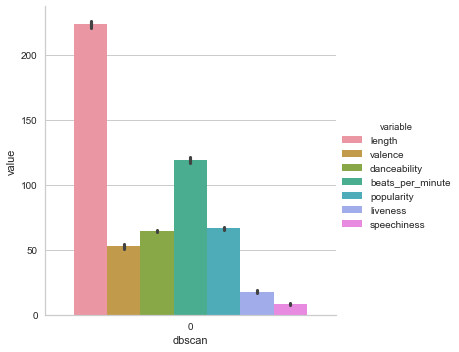

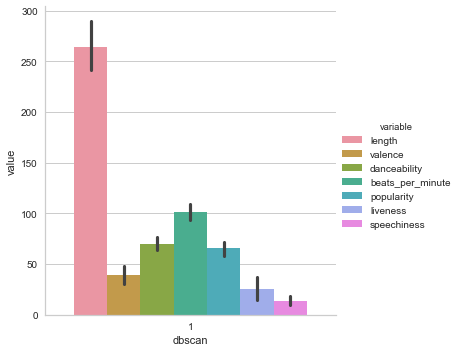

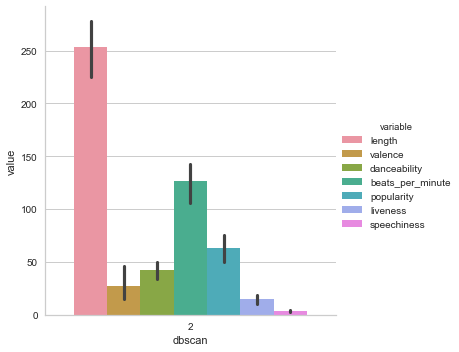

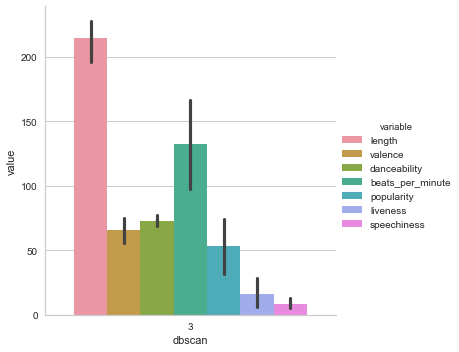

In [51]:
# 4 is the number of clusters in DBScan
for i in range(4):
    sns.catplot(x='dbscan', y='value', hue='variable', data=tidy[tidy['dbscan']==i], height=5, aspect=1, kind='bar')

We can see that the songs from our data have been classified into four major clusters based on their song attributes.
<br/> <br/>
> **Our Clusters for the generalized genre data:**<br/>
> 0 - Songs are average in length and speed, more cheerful in valence, high popularity <br/>
> 1 - Songs tend to be long, slower (lower bpm),  sadder tracks <br/>
> 2 - Songs tend to be long, faster (higher bpm), overall sadder (low valence), with lower danceability and little speech <br/>
> 3 - Songs tend to be fast (high bpm), have high danceability, very upbeat/cheerful


## Making Personalized Playlists from our Clusters

By clustering songs with similar attributes together, we can get a better understanding of our users' music choice. If a user tends to have a preference for the 'signature sounds' of one cluster, we can recommend similar songs in order to keep the user engaged and improve their overall experience with our platform! Let's have a look at the songs in each of our clusters so we can get an idea of what songs are classified together.
<br/><br/>
We are using the clusters from our data which contained all the subgenres because it performed the best. 

In [52]:
# add clustering labels to dataframe

data.insert(0, 'playlist_number', kmeans.labels_)

data.head()    # Our data now has the playlist number in a separate column

,playlist_number,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity,dbscan
0,0,"Hey, Soul Sister",Train,neo mellow,2010,97.0,89,67,-4,8,80,217,19,4,83,0
1,1,Love The Way You Lie,Eminem,hip hop,2010,87.0,93,75,-5,52,64,263,24,23,82,1
2,0,TiK ToK,Kesha,pop,2010,120.0,84,76,-3,29,71,200,10,14,80,2
3,0,Bad Romance,Lady Gaga,pop,2010,119.0,92,70,-4,8,71,295,0,4,79,2
4,0,Just the Way You Are,Bruno Mars,pop,2010,109.0,84,64,-5,9,43,221,2,4,78,2


In [53]:
data.playlist_number.unique()

array([0, 1, 2, 3], dtype=int64)

In [54]:
# Playlist 1
data.loc[data['playlist_number'] == 0, data.columns[[1, 2]]]

,track,artist
0,"Hey, Soul Sister",Train
2,TiK ToK,Kesha
3,Bad Romance,Lady Gaga
4,Just the Way You Are,Bruno Mars
5,Baby,Justin Bieber
6,Dynamite,Taio Cruz
7,Secrets,OneRepublic
8,Empire State of Mind (Part II) Broken Down,Alicia Keys
9,Only Girl (In The World),Rihanna
10,Club Can't Handle Me (feat. David Guetta),Flo Rida


In [55]:
# Playlist 2
data.loc[data['playlist_number'] == 1, data.columns[[1, 2]]]

,track,artist
1,Love The Way You Lie,Eminem
15,OMG (feat. will.i.am),Usher
47,DJ Got Us Fallin' In Love (feat. Pitbull),Usher
48,Castle Walls (feat. Christina Aguilera),T.I.
63,Monster,Kanye West
158,"Hold On, We're Going Home",Drake
209,Freak,Kelly Rowland
230,Fancy,Iggy Azalea
339,See You Again (feat. Charlie Puth),Wiz Khalifa
379,"Me, Myself & I",G-Eazy


In [56]:
# Playlist 3
data.loc[data['playlist_number'] == 2, data.columns[[1, 2]]]

,track,artist
106,Paradise,Coldplay
143,Hall of Fame,The Script
192,Atlas - From The Hunger Games: Catching Fire...,Coldplay
250,A Sky Full of Stars,Coldplay
507,A L I E N S,Coldplay


In [57]:
# Playlist 4
data.loc[data['playlist_number'] == 3, data.columns[[1, 2]]]

,track,artist
440,Picky - Remix,Joey Montana
441,Behind Your Back,Nelly Furtado
461,Despacito - Remix,Luis Fonsi
550,Mi Gente (feat. Beyoncé),J Balvin
597,Con Calma - Remix,Daddy Yankee


In [58]:
# Playlist 5
data.loc[data['playlist_number'] == 4, data.columns[[1, 2]]]

,track,artist


In [585]:
# Playlist 6
data.loc[data['playlist_number'] == 5, data.columns[[1, 2]]]

,track,artist
50,Hello,Martin Solveig
140,Wake Me Up,Avicii
146,Don't You Worry Child - Radio Edit,Swedish House Mafia
147,Get Lucky (feat. Pharrell Williams & Nile Rodg...,Daft Punk
154,Clarity,Zedd
162,Lose Yourself to Dance,Daft Punk
217,Hey Brother,Avicii
225,Latch,Disclosure
244,Stay The Night - Featuring Hayley Williams Of ...,Zedd
252,Chandelier,Sia


In [586]:
# Playlist 6
data.loc[data['playlist_number'] == 5, data.columns[[1, 2]]]

,track,artist
50,Hello,Martin Solveig
140,Wake Me Up,Avicii
146,Don't You Worry Child - Radio Edit,Swedish House Mafia
147,Get Lucky (feat. Pharrell Williams & Nile Rodg...,Daft Punk
154,Clarity,Zedd
162,Lose Yourself to Dance,Daft Punk
217,Hey Brother,Avicii
225,Latch,Disclosure
244,Stay The Night - Featuring Hayley Williams Of ...,Zedd
252,Chandelier,Sia


In [587]:
# Playlist 7
data.loc[data['playlist_number'] == 6, data.columns[[1, 2]]]

,track,artist
1,Love The Way You Lie,Eminem
15,OMG (feat. will.i.am),Usher
47,DJ Got Us Fallin' In Love (feat. Pitbull),Usher
48,Castle Walls (feat. Christina Aguilera),T.I.
63,Monster,Kanye West
158,"Hold On, We're Going Home",Drake
209,Freak,Kelly Rowland
230,Fancy,Iggy Azalea
339,See You Again (feat. Charlie Puth),Wiz Khalifa
379,"Me, Myself & I",G-Eazy


# Hypothesis Testing

In order to gain and retain spotify premium users, it is important to continually generate analytical insights to improve the listening experience of Spotify customers. By looking into what features may influence the popularity of a song, we may gain some knowledge on what music or artists to invest in, or how to determine who the next bit artist will be. We will use statistical analysis and hypothesis testing to answer the following questions:

>**1. Does valence have a statistically significant effect on the popularity of a song?** <br/> <br/>
>**2. Does danceability have a statistically significant effect on the popularity of a song? At what levels of danceability?**

In order to answer these questions, we will form two hypotheses: a null hypothesis (H<sub>0</sub>) and an alternative hypothesis (H<sub>1</sub>). The null hypothesis is when there is no significant difference between specified populations. The alternate hypothesis is the opposite of the null hypothesis and it is the focus of our testing.

## Question 1: Does having a high valence have a statistically significant effect on the popularity of a song?

 - H<sub>0</sub>: $\mu$<sub>1</sub> = $\mu$<sub>2</sub> Valence has no effect on the popularity of a song.
 - H<sub>1</sub>: $\mu$<sub>1</sub> > or < $\mu$<sub>2</sub> Valence does have an effect on the popularity of a song. 

In [589]:
# Function for plotting histograms
def sns_histogram(values, bins=20, alpha=0.5):
    plt.figure(figsize=(8, 5))
    plt.grid(True)
    sns.distplot(values, bins=bins)
    plt.show()

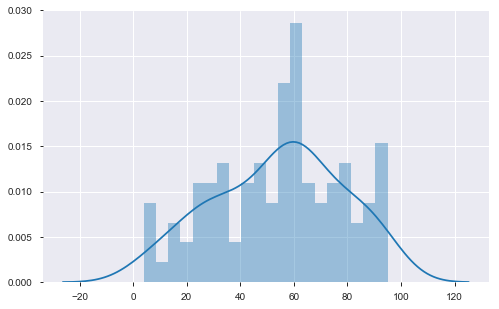

In [590]:
sns_histogram(np.random.choice(data.valence, size = 100), bins = 20)

In [591]:
data['valence'].value_counts()

65    18
45    16
52    15
40    12
35    12
74    11
73    11
59    11
44    11
53    10
64    10
66    10
58     9
34     9
33     9
61     9
48     9
80     9
50     9
23     9
57     9
56     8
55     8
51     8
76     8
79     8
62     8
47     8
39     8
32     8
      ..
8      4
18     4
36     4
81     4
91     4
90     4
89     4
60     4
43     4
94     3
24     3
95     3
7      3
70     3
10     3
96     2
13     2
15     2
31     2
17     2
77     2
4      2
87     2
11     2
98     1
12     1
22     1
97     1
92     1
0      1
Name: valence, Length: 94, dtype: int64

In [592]:
# Get the median of the order frequency to create the samples
med_val = data['valence'].median()
med_val

52.0

In [593]:
# Create 2 sample groups, high valence and low valence
high_val = data.loc[data['valence'] > med_val]
low_val = data.loc[data['valence'] <= med_val]

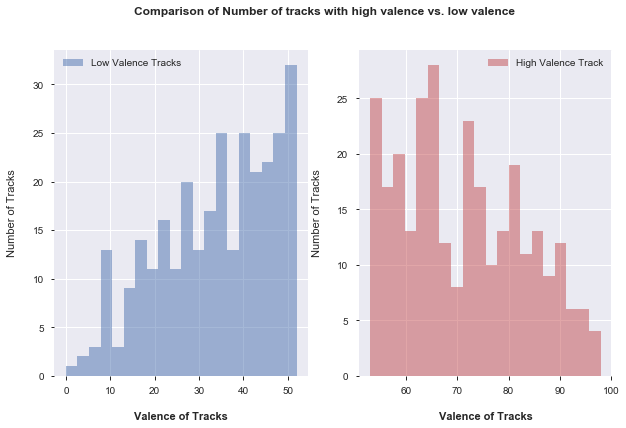

In [594]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,6))

ax1.hist(low_val['valence'], bins = 20, color = 'b', alpha= 0.5, label = 'Low Valence Tracks') 
ax1.set_xlabel('\nValence of Tracks', fontweight='bold')
ax1.set_ylabel('Number of Tracks\n')
ax1.legend()

ax2.hist(high_val['valence'], bins = 20, color = 'r', alpha= 0.5, label = 'High Valence Track') 
ax2.set_xlabel('\nValence of Tracks', fontweight='bold')
ax2.set_ylabel('Number of Tracks\n')
ax2.legend()

fig.suptitle('Comparison of Number of tracks with high valence vs. low valence', fontweight='bold')
plt.show()

The low valence histogram seems skewed to the left, whereas the high valence tracks seem to be skewed to the right. Neither appear to be normally distributed. As a sanity check, we'll use the Shapiro-Wilk test for normality.

#### Assumptions for Normality Test:
Checking normality using the **Shapiro-Wilk** Test:<br/>
- H0: distribution is normal
- H1: distribution is not normal

In [595]:
print(scs.shapiro(high_val['valence']))
print(scs.shapiro(low_val['valence']))

(0.9566668272018433, 1.32700378685513e-07)
(0.9521926641464233, 3.03675875557019e-08)


Both p-values are extremely small, which confirms that the distributions are not normal. Now we will perform the Levene test to check the homogeneity of the variances.
<br/>
#### Assumptions for Homogeneity Test: <br/>
- H0: variances are normal
- H1: variances are not normal

In [596]:
print(scs.levene(high_val['valence'], low_val['valence']))

LeveneResult(statistic=1.263592242154904, pvalue=0.26143326640951536)


The high p-value indicates that we cannot reject the null hypothesis that the variances are normal. Since the distribution is not normal and the variances are different, we will use the non-parametric Welch's T-test.
<br/><br/>
**Independence and Randomness:** <br/>
The data is independent within groups and between groups because each track is different and has no influence on any other track. Each sample will be randomly chosen using the numpy random.choice function.

### Welch's T-test

The purpose of this test is similar to the student's t-test in that it determines if two sample means are significantly different, but unlike the student t-tests, Welch’s increases the test power for samples with unequal variance by adjusting the degrees of freedom. Welch’s tends to perform better than the standard t-test when the sample sizes and variances are unequal between groups and gives the same result as the standard t-test when the sample sizes and variances are equal.

In [597]:
# Create one random sample from each group
sample_high_val =np.random.choice(high_val.popularity, size=25)
sample_low_val =np.random.choice(low_val.popularity, size=25)

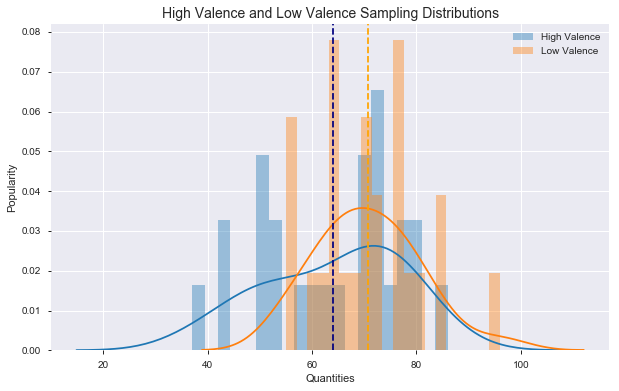

In [598]:
# Visualization of the distributions of each sample group and their respective means
plt.figure(figsize=(10, 6))
plt.grid(True)
sns.distplot(sample_high_val, bins=20, label = 'High Valence')
sns.distplot(sample_low_val, bins=20, label = 'Low Valence')

plt.axvline(x=sample_high_val.mean(), color='navy', linestyle = '--')
plt.axvline(x=sample_low_val.mean(), color='orange', linestyle = '--')

plt.title('High Valence and Low Valence Sampling Distributions', fontsize = 14)
plt.xlabel('Quantities')
plt.ylabel('Popularity')

plt.legend()
plt.show();

In [599]:
# Welch's T-test
p = stats.ttest_ind(high_val.popularity, low_val.popularity)[1]
print("p-value: ", p)
print('Reject Null Hypothesis') if p < 0.05 else print('Failed to reject Null Hypothesis')

p-value:  0.3048121571837561
Failed to reject Null Hypothesis


The p-value is high, so we failed to reject the null hypothesis that valence has no effect on the popularity of a song. 

### Conclusions <br/>
- The valence/mood has no significant effect on the popularity of a song 
- There is a market for a diverse range of sounds 

## Question 2: Does danceability have a statistically significant effect on the popularity of a track? If so, at what level(s) of danceability?

In order to answer the first part of this question, we should break it down into the null hypothesis and the alternative hypothesis:

### Part 1:

 - H<sub>0</sub>: $\mu$<sub>1</sub> = $\mu$<sub>2</sub> Danceability has no effect on the popularity of a track.
 - H<sub>1</sub>: $\mu$<sub>1</sub> > or < $\mu$<sub>2</sub> Danceability has a significant effect on the popularity of a track. 

In [600]:
df1 = data[['danceability', 'popularity']]
df1.head()

,danceability,popularity
0,67,83
1,75,82
2,76,80
3,70,79
4,64,78


In [601]:
df1.describe()

,danceability,popularity
count,587.000000,587.000000
mean,64.480409,66.425894
std,13.384988,14.623928
min,0.000000,0.000000
25%,57.000000,60.000000
50%,66.000000,69.000000
75%,73.000000,76.000000
max,97.000000,99.000000


The mean 'danceability' of a track is approximately 64 with a range of 0 to 97. The mean 'popularity' of a track is approximately 66 with a range of 0 to 99.

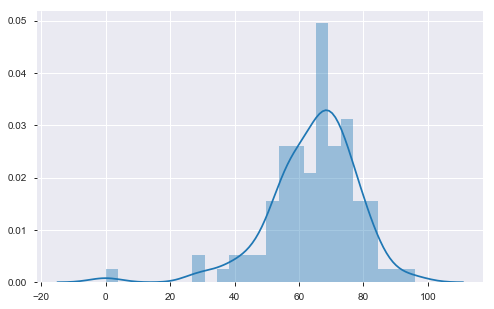

In [602]:
sns_histogram(np.random.choice(df1.danceability, size = 100), bins = 25)

In [603]:
# Get the median of the order frequency to create the samples
med_dance = data['danceability'].median()
med_dance

66.0

In [604]:
# Create 2 sample groups, high cedanceability and low danceability
high_dance = data.loc[data['danceability'] > med_dance]
low_dance = data.loc[data['danceability'] <= med_dance]

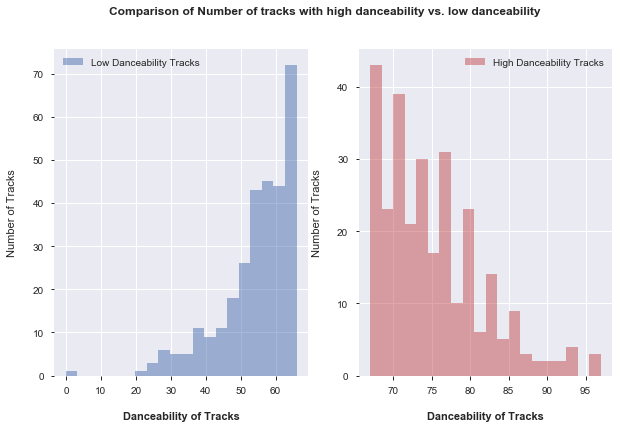

In [605]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(10,6))

ax1.hist(low_dance['danceability'], bins = 20, color = 'b', alpha= 0.5, label = 'Low Danceability Tracks') 
ax1.set_xlabel('\nDanceability of Tracks', fontweight='bold')
ax1.set_ylabel('Number of Tracks\n')
ax1.legend()

ax2.hist(high_dance['danceability'], bins = 20, color = 'r', alpha= 0.5, label = 'High Danceability Tracks') 
ax2.set_xlabel('\nDanceability of Tracks', fontweight='bold')
ax2.set_ylabel('Number of Tracks\n')
ax2.legend()

fig.suptitle('Comparison of Number of tracks with high danceability vs. low danceability', fontweight='bold')
plt.show()

We will use the **Shapiro-Wilk test** to check for normality of the distribution. For this test, the hypotheses are:
- H0: distribution is normal
- H1: distribution is not normal

In [606]:
print(scs.shapiro(high_dance.popularity))
print(scs.shapiro(low_dance.popularity))

(0.9191905856132507, 2.4484123062329388e-11)
(0.8979538679122925, 2.4524170671655354e-13)


The low p-values mean that we must reject the null hypothesis that the distribution is normal. <br/>

Next, we'll check the homogeneity of variances using the **Levene Test**. Fot the Levene test, the hypotheses are:
- H0: The variances are equal
- H1: The variances are not equal

In [607]:
print(scs.levene(high_dance.popularity, low_dance.popularity))

LeveneResult(statistic=0.06113267276548172, pvalue=0.8048013270510354)


The high p-value indicates that we cannot reject the null hypothesis that the variances are equal. Since the distribution is not normal and the variances are equal, we will use Welch's T-test. 

### Welch's T-test

In [608]:
# Create one random sample from each group
sample_high_dance =np.random.choice(high_dance.popularity, size=25)
sample_low_dance =np.random.choice(low_dance.popularity, size=25)

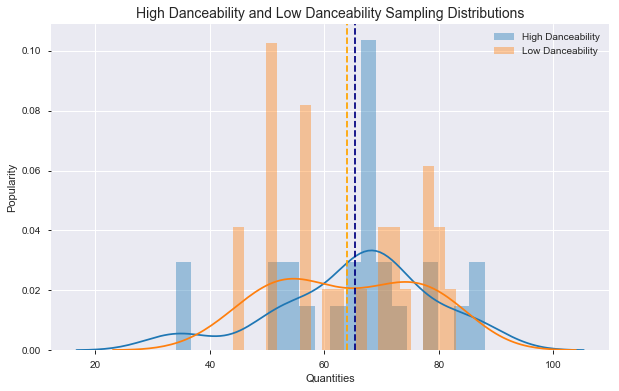

In [609]:
# Visualization of the distributions of each sample group and their respective means
plt.figure(figsize=(10, 6))
plt.grid(True)
sns.distplot(sample_high_dance, bins=20, label = 'High Danceability')
sns.distplot(sample_low_dance, bins=20, label = 'Low Danceability')

plt.axvline(x=sample_high_dance.mean(), color='navy', linestyle = '--')
plt.axvline(x=sample_low_dance.mean(), color='orange', linestyle = '--')

plt.title('High Danceability and Low Danceability Sampling Distributions', fontsize = 14)
plt.xlabel('Quantities')
plt.ylabel('Popularity')

plt.legend()
plt.show();

In [610]:
# Welch's T-test
p = stats.ttest_ind(high_dance.popularity, low_dance.popularity)[1]
print("p-value: ", p)
print('Reject Null Hypothesis') if p < 0.05 else print('Failed to reject Null Hypothesis')

p-value:  0.19869512082605628
Failed to reject Null Hypothesis


### Part 2: <br/>
Even though danceability didn't have a statistically significant effect on popularity, let's compare the different levels of danceability.

In [611]:
df1.danceability.value_counts()

65    25
67    24
69    23
63    21
72    21
70    20
68    19
71    19
75    17
76    16
58    16
61    16
59    16
60    15
77    15
66    15
74    15
73    15
80    14
56    14
57    13
55    13
53    13
62    13
64    11
51    10
78    10
47     9
79     9
50     9
      ..
44     4
93     4
54     3
87     3
86     3
39     3
28     3
37     3
41     3
26     3
30     2
31     2
35     2
29     2
36     2
97     2
49     2
88     2
90     2
40     1
43     1
46     1
33     1
32     1
96     1
91     1
27     1
92     1
23     1
0      1
Name: danceability, Length: 70, dtype: int64

In [612]:
bins = [0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100]
labels = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
df1['dance_bin'] = pd.cut(df1['danceability'], bins=bins, labels=labels)
print(df1)

     danceability  popularity dance_bin
0              67          83         7
1              75          82         8
2              76          80         8
3              70          79         7
4              64          78         7
5              73          77         8
6              75          77         8
7              52          77         6
8              48          76         5
9              79          73         8
10             62          73         7
11             62          73         7
12             77          73         8
13             83          73         9
14             44          72         5
15             78          72         8
16             72          71         8
17             82          70         9
18             63          69         7
19             83          69         9
20             80          68         8
21             44          66         5
22             73          66         8
23             70          65         7


In [613]:
df1.dance_bin.value_counts()

7     187
8     151
6     120
5      46
9      41
4      20
3      12
10      9
2       0
1       0
Name: dance_bin, dtype: int64

In [614]:
mc1 = MultiComparison(df1['popularity'], df1['dance_bin'])
mc1_results = mc1.tukeyhsd()
print(mc1_results)

  Multiple Comparison of Means - Tukey HSD, FWER=0.05  
group1 group2 meandiff p-adj    lower    upper   reject
-------------------------------------------------------
   3.0    4.0      2.9    0.9  -13.3767  19.1767  False
   3.0    5.0   8.5978 0.6266   -5.8513  23.0469  False
   3.0    6.0    7.175 0.7458   -6.3209  20.6709  False
   3.0    7.0   8.5842 0.5295   -4.6901  21.8585  False
   3.0    8.0   9.2401 0.4419   -4.1293  22.6094  False
   3.0    9.0  12.1646 0.1933   -2.4656  26.7949  False
   3.0   10.0   4.8611    0.9  -14.7948   24.517  False
   3.0    nan   -58.25 0.0033 -104.6456 -11.8544   True
   4.0    5.0   5.6978 0.8482   -6.2413   17.637  False
   4.0    6.0    4.275    0.9    -6.491   15.041  False
   4.0    7.0   5.6842 0.7263   -4.8026  16.1711  False
   4.0    8.0   6.3401 0.6216   -4.2669   16.947  False
   4.0    9.0   9.2646 0.3013   -2.8931  21.4224  False
   4.0   10.0   1.9611    0.9  -15.9309  19.8531  False
   4.0    nan   -61.15 0.0012 -106.8263 -15.4737

### Conclusions <br/>
- We fail to reject the null hypothesis that any level of danceability has an affect on popularity
- This supports the idea that our users have a diverse sound palette
- Our consumers may be open to a wide variety of songs, so we need to provide a way for users to discover new artists in different genres they may not be familiar with.

# Multiple Linear Regression to make a prediction for 2020 

Now let's see if we can determine what a popular song for 2020 will sound like! 

In [617]:
df_features = data.drop(['track', 'artist','top_genre', 'dbscan','playlist_number'], axis = 1)

df_features.head()

,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
0,2010,97.0,89,67,-4,8,80,217,19,4,83
1,2010,87.0,93,75,-5,52,64,263,24,23,82
2,2010,120.0,84,76,-3,29,71,200,10,14,80
3,2010,119.0,92,70,-4,8,71,295,0,4,79
4,2010,109.0,84,64,-5,9,43,221,2,4,78


Normalization of the data to get the values between 0 and 1 in order to help with PCA and regression analysis.

In [618]:
# Normalize the data with Min/Max scaler

scaler = MinMaxScaler() 

df_norm = scaler.fit_transform(df_features)

df_norm = pd.DataFrame(df_norm, columns = df_features.columns)

df_norm.describe()

,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
count,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000,587.000000
mean,0.509938,0.465406,0.719327,0.664746,0.938466,0.241263,0.532924,0.312407,0.143772,0.172416,0.670969
std,0.290151,0.149519,0.166038,0.137990,0.048714,0.177781,0.229722,0.117762,0.207682,0.152160,0.147716
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.333333,0.349693,0.622449,0.587629,0.931034,0.121622,0.357143,0.234483,0.020202,0.083333,0.606061
50%,0.555556,0.472393,0.755102,0.680412,0.948276,0.162162,0.530612,0.300000,0.060606,0.104167,0.696970
75%,0.777778,0.527607,0.836735,0.752577,0.965517,0.324324,0.704082,0.363793,0.171717,0.187500,0.767677
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [619]:
# Fitting PCA with our data
pca = PCA().fit(df_norm)

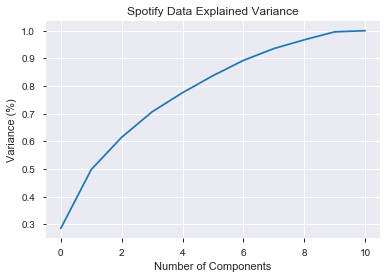

In [620]:
#Plotting the Cumulative Summation of the Explained Variance

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Components')
plt.ylabel('Variance (%)') #for each component
plt.title('Spotify Data Explained Variance')
plt.show()

In [621]:
# print the explained variance for each component

explained_variance = pca.explained_variance_ratio_

print(explained_variance)

[0.28559753 0.21241508 0.11675532 0.09204024 0.06914487 0.06149588
 0.05521769 0.04270284 0.03167639 0.02882957 0.00412458]


In [622]:
# how much variance can be explained for 8 components

print('The explained variance for this many components is:  ',explained_variance[0:8].sum())

The explained variance for this many components is:   0.9353694712687923


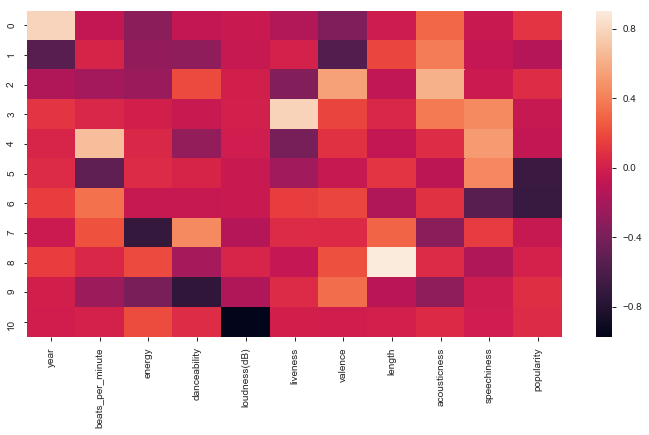

In [623]:
# visually inspect pca

pcamap = pd.DataFrame(pca.components_, columns=df_norm.columns)
plt.figure(figsize=(12,6))
sns.heatmap(pcamap);

In [624]:
# choose number of components

pca = PCA(n_components = 8)

data_pca = pca.fit_transform(df_norm)

In [625]:
# setup features and target

X = df_features[['year']]
y = data_pca

# can switch variable z to y to see effect of all features on predicition (also change y to z)
z = df_features[['beats_per_minute', 'energy', 'danceability', 'loudness(dB)', 'liveness', 'valence', 'length', 'acousticness', 'speechiness', 'popularity']]

In [626]:
# Train, Test, Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

# Instantiate model
mlr = LinearRegression()

# Fit Model
mlr.fit(X_train, y_train)

# Predict
y_pred = mlr.predict(X_test)

# RMSE
print('The Root Mean Squared Error for this model is:  ', np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

The Root Mean Squared Error for this model is:   0.16000764150195784


In [627]:
# K-Fold Cross Val 

mlr = LinearRegression()
mlr.fit(X, y)
mse = cross_val_score(mlr, X, y, scoring='neg_mean_squared_error', cv=10)

# fix the sign of MSE scores
mse_scores = -mse

# convert from MSE to RMSE
rmse_scores = np.sqrt(mse_scores)

# calculate the average RMSE
print('The Root Mean Squared Error for this model is:  ', rmse_scores.mean())

The Root Mean Squared Error for this model is:   0.169728870299317


We will also try Ridge and Lasso regression to reduce model complexity and prevent over-fitting.

In [628]:
# Ridge Regression and GridSearchCV
ridge = Ridge()

params = { 'alpha' : [ 1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20, 40, 80, 100, 1000, 10000 ]  }

rr = GridSearchCV(ridge, params, scoring = 'neg_mean_squared_error', cv=10)

rr.fit(X, y)

print(rr.best_params_)
print(rr.best_score_)

rr_mse = -(rr.best_score_)

rr_rmse = np.sqrt(rr_mse)

print('The Root Mean Squared Error for this model is:  ', rr_rmse)

{'alpha': 40}
-0.02900975576630881
The Root Mean Squared Error for this model is:   0.17032250516684166


In [629]:
# Lasso Regression and GridSearchCV
lasso = Lasso()

params = { 'alpha' : [ 1e-15, 1e-10, 1e-8, 1e-4, 1e-3, 1e-2, 1, 5, 10, 20, 40, 80, 100, 1000, 10000 ]  }

lr = GridSearchCV(lasso, params, scoring = 'neg_mean_squared_error', cv=10)

lr.fit(X, y)

print(lr.best_params_)
print(lr.best_score_)

lr_mse = -(lr.best_score_)

lr_rmse = np.sqrt(lr_mse)

print('The Root Mean Squared Error for this model is:  ', lr_rmse)

{'alpha': 0.01}
-0.02897647172807661
The Root Mean Squared Error for this model is:   0.1702247682567863


Our K-fold Cross Validation MLR model performed the best with the smallest error value.

In [630]:
# predict a hit song in 2020's features

hit = mlr.predict([[2020]])

hit

array([[ 0.55037906, -0.28017903, -0.04599495,  0.02447664,  0.00557836,
         0.01002256,  0.01909692, -0.00392808]])

In [631]:
# reverse pca
hit = pca.inverse_transform(hit)

hit

array([[1.10956967, 0.43098182, 0.64246699, 0.68995126, 0.92561321,
        0.19105372, 0.47108893, 0.25080773, 0.18478225, 0.17747873,
        0.7440817 ]])

In [632]:
# reverse normalization
hit = scaler.inverse_transform(hit)
    
hit

array([[2019.986127  ,  113.25003605,   62.96176545,   66.92527228,
          -6.3144341 ,   14.13797494,   46.16671541,  206.73424195,
          18.2934428 ,    8.51897911,   73.66408827]])

Finding a song from our data to serve as an example for the predicted values by using the machine learning technique, K-Nearest Neighbor Classifier

In [633]:
# get the features of the prediciton into a dataframe
hit = pd.DataFrame(hit)

hit = hit.drop(columns = [0], axis=1)

hit

,1,2,3,4,5,6,7,8,9,10
0,113.250036,62.961765,66.925272,-6.314434,14.137975,46.166715,206.734242,18.293443,8.518979,73.664088


In [636]:
# make a prediction for 2020 using the machine learning classifier KNN

knn = KNeighborsClassifier(n_neighbors = 1)

knn.fit(df_features[['year', 'beats_per_minute','energy','danceability','loudness(dB)','liveness','valence', 'length', 'acousticness', 'speechiness']], df_features.index)

y_pred = knn.predict(hit)

y_pred = pd.DataFrame(y_pred)

y_pred

,0
0,32


In [637]:
# look up the index

winner = data.iloc[[32]]

winner

,playlist_number,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity,dbscan
32,3,Blah Blah Blah (feat. 3OH!3),Kesha,pop,2010,120.0,84,75,-3,42,52,172,8,12,62,2


If you would like to write a hit song in 2020, you can write a song similar to Blah Blah Blah by Kesha! 

# Future Work: Time Series

For this project, our goal is to interpret and answer the following question: <br/>
> **What are the top 5 genres of music we should invest in marketing and promoting?**

I'm approaching this question as a consultant for a record label. There are so many new artists breaking into the scene every year and new genres and sounds are being created. It is important to consider the growing popularity of the genre. We want to invest in a genre that is growing, but not peaked in popularity yet.

In [791]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 587 entries, 0 to 602
Data columns (total 14 columns):
track               587 non-null object
artist              587 non-null object
top_genre           587 non-null object
year                587 non-null int64
beats_per_minute    587 non-null float64
energy              587 non-null int64
danceability        587 non-null int64
loudness(dB)        587 non-null int64
liveness            587 non-null int64
valence             587 non-null int64
length              587 non-null int64
acousticness        587 non-null int64
speechiness         587 non-null int64
popularity          587 non-null int64
dtypes: float64(1), int64(10), object(3)
memory usage: 68.8+ KB


In [792]:
data.head()

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
0,"Hey, Soul Sister",Train,neo mellow,2010,97.0,89,67,-4,8,80,217,19,4,83
1,Love The Way You Lie,Eminem,hip hop,2010,87.0,93,75,-5,52,64,263,24,23,82
2,TiK ToK,Kesha,pop,2010,120.0,84,76,-3,29,71,200,10,14,80
3,Bad Romance,Lady Gaga,pop,2010,119.0,92,70,-4,8,71,295,0,4,79
4,Just the Way You Are,Bruno Mars,pop,2010,109.0,84,64,-5,9,43,221,2,4,78


In [794]:
# change year to datetime format
data['year'] = pd.to_datetime(data['year'].astype(int), format='%Y')

In [795]:
data.head()

,track,artist,top_genre,year,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
0,"Hey, Soul Sister",Train,neo mellow,2010-01-01,97.0,89,67,-4,8,80,217,19,4,83
1,Love The Way You Lie,Eminem,hip hop,2010-01-01,87.0,93,75,-5,52,64,263,24,23,82
2,TiK ToK,Kesha,pop,2010-01-01,120.0,84,76,-3,29,71,200,10,14,80
3,Bad Romance,Lady Gaga,pop,2010-01-01,119.0,92,70,-4,8,71,295,0,4,79
4,Just the Way You Are,Bruno Mars,pop,2010-01-01,109.0,84,64,-5,9,43,221,2,4,78


In [796]:
# set the year as the index
ts_data = data.set_index('year')
ts_data.head()

,track,artist,top_genre,beats_per_minute,energy,danceability,loudness(dB),liveness,valence,length,acousticness,speechiness,popularity
year,,,,,,,,,,,,,
2010-01-01,"Hey, Soul Sister",Train,neo mellow,97.0,89,67,-4,8,80,217,19,4,83
2010-01-01,Love The Way You Lie,Eminem,hip hop,87.0,93,75,-5,52,64,263,24,23,82
2010-01-01,TiK ToK,Kesha,pop,120.0,84,76,-3,29,71,200,10,14,80
2010-01-01,Bad Romance,Lady Gaga,pop,119.0,92,70,-4,8,71,295,0,4,79
2010-01-01,Just the Way You Are,Bruno Mars,pop,109.0,84,64,-5,9,43,221,2,4,78


In [797]:
ts_data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 587 entries, 2010-01-01 to 2019-01-01
Data columns (total 13 columns):
track               587 non-null object
artist              587 non-null object
top_genre           587 non-null object
beats_per_minute    587 non-null float64
energy              587 non-null int64
danceability        587 non-null int64
loudness(dB)        587 non-null int64
liveness            587 non-null int64
valence             587 non-null int64
length              587 non-null int64
acousticness        587 non-null int64
speechiness         587 non-null int64
popularity          587 non-null int64
dtypes: float64(1), int64(9), object(3)
memory usage: 64.2+ KB


### Top Genre Selection

In [798]:
# get genres with popularity in top 25% (highly popular)
print(ts_data.popularity.describe(),'\n')

#Calculate the 25% cutoff value.
ts_data25 = ts_data.popularity.quantile(q=0.25)
print(f'Size Rank 25% cutoff value: {ts_data25}', '\n')

#Get data frame with selected popularity. Keep popularity and genres only.
ts_data_top25 = ts_data[ts_data['popularity']<ts_data25].drop(['track', 'artist', 'beats_per_minute', 'energy', 'danceability', 'loudness(dB)', 'liveness', 
                                                           'valence', 'length', 'acousticness', 'speechiness'],axis=1)
print(f'Amount of genres: {len(ts_data_top25)}', '\n')
print("Top Popular Genres: ", ts_data_top25['top_genre'].unique())

count    587.000000
mean      66.425894
std       14.623928
min        0.000000
25%       60.000000
50%       69.000000
75%       76.000000
max       99.000000
Name: popularity, dtype: float64 

Size Rank 25% cutoff value: 60.0 

Amount of genres: 146 

Top Popular Genres:  ['pop' 'hip hop' 'room' 'boy band' 'permanent wave' 'alaska indie'
 'australian dance' 'neo mellow' 'hollywood' 'british soul' 'complextro'
 'latin' 'edm' 'downtempo']


### Median popularity

In [799]:
ts_data_top25['pop_avg']=ts_data_top25.iloc[:,-12:].mean(skipna=True, axis=1)

#Get genres with an average value 1.5 decile above the median and 1.5 deciles below.
print(ts_data_top25['pop_avg'].describe(),'\n')

#Calculate the 65% cutoff value (1 decile above).
q_65 = ts_data_top25['pop_avg'].quantile(q=0.65)
print(f'Average Popularity 65% cutoff value: {round(q_65,2)}')

#Calculate the 35% cutoff value (1.5 deciles below).
q_35 = ts_data_top25['pop_avg'].quantile(q=0.35)
print(f'Average Popularity 35% cutoff value: {round(q_35,2)}')

#Get data frame with selected zipcodes.
genre_pref = ts_data_top25[(ts_data_top25['pop_avg']<q_65) & (ts_data_top25['pop_avg']>q_35)]
print(f'Amount of genres: {len(genre_pref)}')

print("Top preferred Genres: ", genre_pref['top_genre'].unique())

count    146.000000
mean      46.712329
std       13.284660
min        0.000000
25%       42.000000
50%       51.500000
75%       56.000000
max       59.000000
Name: pop_avg, dtype: float64 

Average Popularity 65% cutoff value: 54.0
Average Popularity 35% cutoff value: 46.0
Amount of genres: 36
Top preferred Genres:  ['pop' 'hip hop' 'boy band' 'neo mellow' 'complextro' 'british soul']


In [804]:
genre_pref.head()

,top_genre,popularity,pop_avg
year,,,
2010-01-01,pop,52,52.0
2010-01-01,hip hop,52,52.0
2010-01-01,hip hop,49,49.0
2011-01-01,pop,50,50.0
2013-01-01,pop,52,52.0


In [805]:
sns.set()

g = sns.PairGrid(df, y_vars = ['Beats Per Minute', 'Energy', 'Danceability', 'Loudness dB', 
                               'Liveness', 'Valence', 'Length', 'Acousticness', 'Speechiness', 'Popularity'] , x_vars = ['year'], aspect = 4)

g = g.map(sns.lineplot, color="blue")

# Adjust the tick positions and labels

g.set(xticks=[2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020])


# Adjust the arrangement of the plots

g.fig.subplots_adjust(wspace=.02, hspace=.02);

TypeError: Cannot index by location index with a non-integer key

In [802]:
plt.figure(figsize=(10, 6))
ax = sns.lineplot(x = 'year', y = 'popularity', hue="top_genre", data=genre_pref)
ax.yaxis.set_ticks_position('both')

plt.legend(genre_pref['top_genre'].unique(), ncol=1, bbox_to_anchor=(1.05, 1));

ValueError: Could not interpret input 'year'

<Figure size 720x432 with 0 Axes>